In [1]:
# AeroCNN-II
import os
import sys
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.impute import SimpleImputer

import datetime
%matplotlib inline

In [2]:
#from tensorflow.python.client import device_lib
#device_lib.list_local_devices()

In [3]:
#mirrored_strategy = tf.distribute.MirroredStrategy(["/GPU:0","/GPU:1", "/GPU:2"], cross_device_ops = tf.distribute.HierarchicalCopyAllReduce())

In [4]:
n_kernel=100
l2Regularizer=1e-09
kernel_size1 = 3
kernel_size2 = 3
#kernel_size3 = 5
n_grid = 100
strides = 1
input_size = 100
lr=5e-04
batch_size=20

In [5]:
alpha = np.linspace(-10,20,16).reshape((16,1))

In [6]:
aa = np.zeros((16*133,1))
for i in range(0, 133):
    aa[16*i:16*(i+1), :] = alpha[:,:]

In [7]:
aa = aa.reshape((133, 16, 1, 1))

In [8]:
os.chdir('D:\\AeroCNN2Inputs')

In [9]:
origin = "D:\\AeroCNN2Inputs2"
origin_data = "D:\\AirfoilClCdCoordinates_out\\AirfoilClCdCoordinates_out"
origin_poisson = "D:\\CNN_poisson_files\\poisson\\bc2"

In [10]:
folders_orig = os.listdir(origin)
folders = [file for file in folders_orig if file.endswith('.csv')]

In [11]:
image_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        image_df = pd.concat([image_df, data], axis=0)

In [12]:
image_np = image_df.iloc[:, :].values

In [13]:
image = image_np.reshape((133, 16, n_grid, n_grid))

In [14]:
image = 1-image/100

In [15]:
field_df = pd.DataFrame()
for i in range(1, 134):
    for j in range(0, alpha.shape[0]):
        csv_file_name = origin_poisson + '\\airfoil' + str(i) + "_alpha"+ str(int(alpha[j])) + ".csv"
        data = pd.read_csv(csv_file_name, header=None)
        field_df = pd.concat([field_df, data], axis=0)

In [16]:
field_np = field_df.iloc[:, :].values

In [17]:
imr = SimpleImputer(missing_values=np.nan, strategy='mean')
imr = imr.fit(field_np)
imputed_field = imr.transform(field_np)

In [18]:
field = imputed_field.reshape((133, 16, n_grid+1, n_grid+1))

In [19]:
field_nor = (field-np.min(field))/(np.max(field)-np.min(field))

In [20]:
file_name = origin_data + "\\AirfoilIndexList.xlsx"
airfoilName_df = pd.read_excel(file_name)
geometry_orig = airfoilName_df.iloc[:, 1].values

In [21]:
geometry = np.zeros((133*16,1))
geometry = geometry.astype(np.string_)
for i in geometry_orig:
    index_ = np.where(geometry_orig==i)
    for j in range(0,16):
        geometry[16*index_[0]+j,:] = np.asarray(i)

In [22]:
geometry.shape

(2128, 1)

In [23]:
geometry = geometry.reshape((133, 16, 1))

In [24]:
x_all, x_test, aa_all, aa_test, geo_all, geo_test, y_all, y_test = train_test_split(image, aa, geometry, field_nor, test_size=0.1, random_state=1)

In [25]:
x_train, x_val, aa_train, aa_val, geo_train, geo_val, y_train, y_val = train_test_split(x_all, aa_all, geo_all, y_all, test_size=0.1, random_state=1)

In [26]:
x_train = x_train.reshape((x_train.shape[0]*x_train.shape[1], x_train.shape[2], x_train.shape[3], 1))
x_val = x_val.reshape((x_val.shape[0]*x_val.shape[1], x_val.shape[2], x_val.shape[3], 1))
x_test = x_test.reshape((x_test.shape[0]*x_test.shape[1], x_test.shape[2], x_test.shape[3], 1))
aa_train = aa_train.reshape((aa_train.shape[0]*aa_train.shape[1], aa_train.shape[2], aa_train.shape[3]))
aa_val = aa_val.reshape((aa_val.shape[0]*aa_val.shape[1], aa_val.shape[2], aa_val.shape[3]))
aa_test = aa_test.reshape((aa_test.shape[0]*aa_test.shape[1], aa_test.shape[2], aa_test.shape[3]))
geo_train = geo_train.reshape((geo_train.shape[0]*geo_train.shape[1], geo_train.shape[2]))
geo_val = geo_val.reshape((geo_val.shape[0]*geo_val.shape[1], geo_val.shape[2]))
geo_test = geo_test.reshape((geo_test.shape[0]*geo_test.shape[1], geo_test.shape[2]))
y_train = y_train.reshape((y_train.shape[0]*y_train.shape[1], y_train.shape[2], y_train.shape[3], 1))
y_val = y_val.reshape((y_val.shape[0]*y_val.shape[1], y_val.shape[2], y_val.shape[3], 1))
y_test = y_test.reshape((y_test.shape[0]*y_test.shape[1], y_test.shape[2], y_test.shape[3], 1))

In [27]:
tf.keras.backend.set_image_data_format('channels_last')

In [28]:
#with mirrored_strategy.scope():
input_image = tf.keras.Input(shape=(n_grid, n_grid, 1))
#reshape0 = tf.keras.layers.Reshape(())

x_conv = tf.keras.layers.Conv2D(n_kernel, (kernel_size1, kernel_size1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer1')(input_image)
x_ = tf.keras.layers.MaxPooling2D((2,2))(x_conv)
x_conv = tf.keras.layers.Conv2D(n_kernel*2, (kernel_size1, kernel_size1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayer2')(x_)
x_ = tf.keras.layers.MaxPooling2D((2,2))(x_conv)

x_conv = tf.keras.layers.Conv2DTranspose(n_kernel*2, (kernel_size1, kernel_size1),
                                         strides=(2,2),
                                         activation='relu', padding='same',
                                         kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                         name='Conv2DTLayer1')(x_)
x_conv = tf.keras.layers.Conv2DTranspose(n_kernel, (kernel_size1, kernel_size1),
                                         strides=(2,2),
                                         activation='relu', padding='same',
                                         kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                         name='Conv2DTLayer2')(x_conv)

x_conv = tf.keras.layers.Conv2D(1, (1, 1), strides=(strides, strides),
                                activation='relu', padding='same',
                                kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer),
                                name='Conv2DLayerFinal')(x_conv)
x_ = tf.keras.layers.Flatten()(x_conv)
x_ = tf.keras.layers.Dense(units=(n_grid+1)**2, activation='linear', name='FCLayer1',
                           kernel_regularizer=tf.keras.regularizers.l2(l2Regularizer))(x_)
#x_ = tf.keras.layers.Dense(units=101*101, activation='linear', name='outputLayer')(x_)
output_data = tf.keras.layers.Reshape((n_grid+1,n_grid+1,1))(x_)

# AeroCNN-II
model = tf.keras.Model(input_image, output_data)

In [29]:
#with mirrored_strategy.scope():
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 100, 100, 1)]     0         
                                                                 
 Conv2DLayer1 (Conv2D)       (None, 100, 100, 100)     1000      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 50, 50, 100)      0         
 )                                                               
                                                                 
 Conv2DLayer2 (Conv2D)       (None, 50, 50, 200)       180200    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 25, 25, 200)      0         
 2D)                                                             
                                                                 
 Conv2DTLayer1 (Conv2DTransp  (None, 50, 50, 200)      360200

In [30]:
#with mirrored_strategy.scope():
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=lr),
              loss = tf.keras.losses.MeanSquaredError(),
              metrics=[tf.keras.metrics.RootMeanSquaredError(name="rmse")])

In [31]:
#with mirrored_strategy.scope():
start = datetime.datetime.now()
history = model.fit(x_train, y_train, validation_data=[x_val, y_val],
                    epochs=5000, shuffle=True, batch_size=batch_size,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='loss', patience=100,
                                                               restore_best_weights=True)])
end = datetime.datetime.now()

Epoch 1/5000
86/86 [==============================] - 18s 58ms/step - loss: 0.0458 - rmse: 0.2141 - val_loss: 0.0199 - val_rmse: 0.1410
Epoch 2/5000
86/86 [==============================] - 3s 34ms/step - loss: 0.0173 - rmse: 0.1315 - val_loss: 0.0015 - val_rmse: 0.0389
Epoch 3/5000
86/86 [==============================] - 3s 33ms/step - loss: 5.3754e-04 - rmse: 0.0230 - val_loss: 2.0743e-04 - val_rmse: 0.0140
Epoch 4/5000
86/86 [==============================] - 3s 33ms/step - loss: 3.1603e-04 - rmse: 0.0175 - val_loss: 6.5770e-04 - val_rmse: 0.0254
Epoch 5/5000
86/86 [==============================] - 3s 33ms/step - loss: 2.3560e-04 - rmse: 0.0150 - val_loss: 1.6862e-04 - val_rmse: 0.0126
Epoch 6/5000
86/86 [==============================] - 3s 34ms/step - loss: 1.7348e-04 - rmse: 0.0128 - val_loss: 1.6830e-04 - val_rmse: 0.0126
Epoch 7/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9973e-04 - rmse: 0.0137 - val_loss: 1.5623e-04 - val_rmse: 0.0121
Epoch 8/5000
8

86/86 [==============================] - 3s 31ms/step - loss: 7.0738e-05 - rmse: 0.0078 - val_loss: 5.3306e-05 - val_rmse: 0.0066
Epoch 59/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0902e-04 - rmse: 0.0099 - val_loss: 6.0296e-05 - val_rmse: 0.0071
Epoch 60/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.0411e-05 - rmse: 0.0084 - val_loss: 1.0447e-04 - val_rmse: 0.0097
Epoch 61/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.0458e-05 - rmse: 0.0071 - val_loss: 1.6434e-04 - val_rmse: 0.0124
Epoch 62/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.1044e-05 - rmse: 0.0084 - val_loss: 5.9107e-05 - val_rmse: 0.0070
Epoch 63/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.5502e-05 - rmse: 0.0074 - val_loss: 2.7712e-05 - val_rmse: 0.0042
Epoch 64/5000
86/86 [==============================] - 3s 33ms/step - loss: 5.2494e-05 - rmse: 0.0065 - val_loss: 3.8013e-05 - val_rmse: 0.0053
Epoch 

Epoch 115/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0243e-05 - rmse: 0.0064 - val_loss: 2.9796e-05 - val_rmse: 0.0045
Epoch 116/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.4147e-05 - rmse: 0.0059 - val_loss: 3.3459e-05 - val_rmse: 0.0049
Epoch 117/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1770e-05 - rmse: 0.0047 - val_loss: 6.1294e-05 - val_rmse: 0.0072
Epoch 118/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.9772e-05 - rmse: 0.0071 - val_loss: 4.9319e-05 - val_rmse: 0.0063
Epoch 119/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.2566e-05 - rmse: 0.0048 - val_loss: 3.4764e-05 - val_rmse: 0.0050
Epoch 120/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.1251e-05 - rmse: 0.0056 - val_loss: 1.6275e-04 - val_rmse: 0.0124
Epoch 121/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0469e-05 - rmse: 0.0055 - val_loss: 2.0433e-05 - va

86/86 [==============================] - 3s 31ms/step - loss: 2.9491e-05 - rmse: 0.0045 - val_loss: 8.0276e-05 - val_rmse: 0.0084
Epoch 172/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.4410e-05 - rmse: 0.0050 - val_loss: 5.6988e-05 - val_rmse: 0.0069
Epoch 173/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3532e-05 - rmse: 0.0067 - val_loss: 4.9215e-05 - val_rmse: 0.0063
Epoch 174/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.9151e-05 - rmse: 0.0045 - val_loss: 2.7685e-05 - val_rmse: 0.0043
Epoch 175/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.4422e-05 - rmse: 0.0050 - val_loss: 2.7135e-05 - val_rmse: 0.0042
Epoch 176/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.9464e-05 - rmse: 0.0045 - val_loss: 3.1597e-05 - val_rmse: 0.0047
Epoch 177/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3602e-05 - rmse: 0.0038 - val_loss: 1.9612e-05 - val_rmse: 0.0032


86/86 [==============================] - 3s 31ms/step - loss: 2.7862e-05 - rmse: 0.0044 - val_loss: 5.1523e-05 - val_rmse: 0.0066
Epoch 228/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.2063e-05 - rmse: 0.0037 - val_loss: 2.2045e-05 - val_rmse: 0.0037
Epoch 229/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0093e-05 - rmse: 0.0034 - val_loss: 3.0697e-05 - val_rmse: 0.0047
Epoch 230/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5638e-05 - rmse: 0.0041 - val_loss: 1.8647e-05 - val_rmse: 0.0032
Epoch 231/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.1220e-05 - rmse: 0.0036 - val_loss: 1.9750e-05 - val_rmse: 0.0034
Epoch 232/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3135e-05 - rmse: 0.0038 - val_loss: 2.7066e-05 - val_rmse: 0.0043
Epoch 233/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3134e-05 - rmse: 0.0038 - val_loss: 1.8101e-05 - val_rmse: 0.0031


86/86 [==============================] - 3s 31ms/step - loss: 1.7155e-05 - rmse: 0.0030 - val_loss: 1.6359e-05 - val_rmse: 0.0029
Epoch 284/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.3896e-05 - rmse: 0.0025 - val_loss: 1.5994e-05 - val_rmse: 0.0029
Epoch 285/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.4730e-05 - rmse: 0.0026 - val_loss: 1.3549e-05 - val_rmse: 0.0024
Epoch 286/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.2774e-05 - rmse: 0.0022 - val_loss: 1.6093e-05 - val_rmse: 0.0029
Epoch 287/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.9421e-05 - rmse: 0.0034 - val_loss: 2.1363e-05 - val_rmse: 0.0037
Epoch 288/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.8233e-05 - rmse: 0.0032 - val_loss: 1.6319e-05 - val_rmse: 0.0029
Epoch 289/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.3444e-05 - rmse: 0.0024 - val_loss: 1.5822e-05 - val_rmse: 0.0028


86/86 [==============================] - 3s 31ms/step - loss: 3.2383e-05 - rmse: 0.0050 - val_loss: 3.0290e-05 - val_rmse: 0.0048
Epoch 340/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8479e-05 - rmse: 0.0064 - val_loss: 2.6463e-05 - val_rmse: 0.0044
Epoch 341/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.5399e-05 - rmse: 0.0028 - val_loss: 1.5465e-05 - val_rmse: 0.0029
Epoch 342/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1750e-05 - rmse: 0.0021 - val_loss: 1.4025e-05 - val_rmse: 0.0026
Epoch 343/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1566e-05 - rmse: 0.0021 - val_loss: 1.4557e-05 - val_rmse: 0.0027
Epoch 344/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1170e-05 - rmse: 0.0020 - val_loss: 1.7984e-05 - val_rmse: 0.0033
Epoch 345/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.3501e-05 - rmse: 0.0025 - val_loss: 1.7074e-05 - val_rmse: 0.0031


86/86 [==============================] - 3s 31ms/step - loss: 1.0157e-05 - rmse: 0.0018 - val_loss: 1.1920e-05 - val_rmse: 0.0023
Epoch 396/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.9227e-06 - rmse: 0.0018 - val_loss: 1.1137e-05 - val_rmse: 0.0021
Epoch 397/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0207e-05 - rmse: 0.0019 - val_loss: 1.2355e-05 - val_rmse: 0.0024
Epoch 398/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1217e-05 - rmse: 0.0021 - val_loss: 1.2283e-05 - val_rmse: 0.0024
Epoch 399/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.9745e-06 - rmse: 0.0018 - val_loss: 1.5977e-05 - val_rmse: 0.0030
Epoch 400/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1049e-05 - rmse: 0.0021 - val_loss: 1.1611e-05 - val_rmse: 0.0022
Epoch 401/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0433e-04 - rmse: 0.0099 - val_loss: 7.8204e-05 - val_rmse: 0.0085


86/86 [==============================] - 3s 31ms/step - loss: 1.0432e-05 - rmse: 0.0020 - val_loss: 1.5583e-05 - val_rmse: 0.0030
Epoch 452/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0502e-05 - rmse: 0.0021 - val_loss: 1.1311e-05 - val_rmse: 0.0022
Epoch 453/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0163e-05 - rmse: 0.0020 - val_loss: 1.2799e-05 - val_rmse: 0.0026
Epoch 454/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0595e-05 - rmse: 0.0021 - val_loss: 1.1532e-05 - val_rmse: 0.0023
Epoch 455/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1462e-05 - rmse: 0.0023 - val_loss: 1.2076e-05 - val_rmse: 0.0024
Epoch 456/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.0907e-05 - rmse: 0.0038 - val_loss: 4.0084e-05 - val_rmse: 0.0058
Epoch 457/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0660e-04 - rmse: 0.0100 - val_loss: 3.4286e-05 - val_rmse: 0.0053


86/86 [==============================] - 3s 31ms/step - loss: 1.2021e-05 - rmse: 0.0025 - val_loss: 1.1312e-05 - val_rmse: 0.0023
Epoch 508/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.8177e-06 - rmse: 0.0020 - val_loss: 1.5147e-05 - val_rmse: 0.0031
Epoch 509/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.2291e-05 - rmse: 0.0025 - val_loss: 1.1828e-05 - val_rmse: 0.0025
Epoch 510/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.4229e-06 - rmse: 0.0019 - val_loss: 1.0459e-05 - val_rmse: 0.0022
Epoch 511/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.3731e-06 - rmse: 0.0019 - val_loss: 1.4530e-05 - val_rmse: 0.0030
Epoch 512/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.0808e-06 - rmse: 0.0018 - val_loss: 1.3999e-05 - val_rmse: 0.0029
Epoch 513/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.1068e-06 - rmse: 0.0015 - val_loss: 9.9523e-06 - val_rmse: 0.0020


86/86 [==============================] - 3s 31ms/step - loss: 1.6529e-05 - rmse: 0.0033 - val_loss: 1.2939e-05 - val_rmse: 0.0027
Epoch 564/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.0221e-06 - rmse: 0.0016 - val_loss: 9.2038e-06 - val_rmse: 0.0020
Epoch 565/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.0200e-06 - rmse: 0.0016 - val_loss: 9.1805e-06 - val_rmse: 0.0019
Epoch 566/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.7261e-06 - rmse: 0.0018 - val_loss: 1.1018e-05 - val_rmse: 0.0024
Epoch 567/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.2511e-05 - rmse: 0.0027 - val_loss: 5.6489e-05 - val_rmse: 0.0071
Epoch 568/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.4567e-05 - rmse: 0.0030 - val_loss: 1.2485e-05 - val_rmse: 0.0027
Epoch 569/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.3038e-05 - rmse: 0.0028 - val_loss: 1.4776e-05 - val_rmse: 0.0031


86/86 [==============================] - 3s 31ms/step - loss: 1.6161e-05 - rmse: 0.0033 - val_loss: 1.0919e-05 - val_rmse: 0.0024
Epoch 620/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.3204e-05 - rmse: 0.0029 - val_loss: 9.4656e-06 - val_rmse: 0.0021
Epoch 621/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.5647e-06 - rmse: 0.0019 - val_loss: 1.3059e-05 - val_rmse: 0.0028
Epoch 622/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.3536e-06 - rmse: 0.0015 - val_loss: 8.2894e-06 - val_rmse: 0.0018
Epoch 623/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.4364e-06 - rmse: 0.0012 - val_loss: 8.7512e-06 - val_rmse: 0.0019
Epoch 624/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.3126e-06 - rmse: 0.0012 - val_loss: 1.6252e-05 - val_rmse: 0.0034
Epoch 625/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1017e-05 - rmse: 0.0025 - val_loss: 1.2550e-05 - val_rmse: 0.0028


86/86 [==============================] - 3s 31ms/step - loss: 6.6402e-06 - rmse: 0.0014 - val_loss: 1.0316e-05 - val_rmse: 0.0024
Epoch 676/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.9383e-06 - rmse: 0.0011 - val_loss: 8.7187e-06 - val_rmse: 0.0020
Epoch 677/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.9685e-06 - rmse: 0.0011 - val_loss: 1.7112e-05 - val_rmse: 0.0035
Epoch 678/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.2724e-05 - rmse: 0.0028 - val_loss: 8.5709e-06 - val_rmse: 0.0020
Epoch 679/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.2858e-06 - rmse: 0.0013 - val_loss: 8.2094e-06 - val_rmse: 0.0019
Epoch 680/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.2448e-06 - rmse: 0.0013 - val_loss: 8.1208e-06 - val_rmse: 0.0019
Epoch 681/5000
86/86 [==============================] - 3s 32ms/step - loss: 8.2625e-06 - rmse: 0.0019 - val_loss: 8.0224e-06 - val_rmse: 0.0018


86/86 [==============================] - 3s 31ms/step - loss: 6.4774e-06 - rmse: 0.0015 - val_loss: 8.8119e-06 - val_rmse: 0.0021
Epoch 732/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.7942e-06 - rmse: 0.0012 - val_loss: 7.1440e-06 - val_rmse: 0.0017
Epoch 733/5000
86/86 [==============================] - 3s 34ms/step - loss: 5.4329e-06 - rmse: 0.0011 - val_loss: 8.4431e-06 - val_rmse: 0.0020
Epoch 734/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.7796e-06 - rmse: 0.0016 - val_loss: 1.3416e-05 - val_rmse: 0.0030
Epoch 735/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.0078e-06 - rmse: 0.0019 - val_loss: 1.0659e-05 - val_rmse: 0.0025
Epoch 736/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.8121e-06 - rmse: 0.0012 - val_loss: 7.6176e-06 - val_rmse: 0.0018
Epoch 737/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.8387e-06 - rmse: 0.0016 - val_loss: 8.6657e-06 - val_rmse: 0.0021


86/86 [==============================] - 3s 31ms/step - loss: 6.6860e-06 - rmse: 0.0016 - val_loss: 7.3301e-06 - val_rmse: 0.0018
Epoch 788/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.6285e-06 - rmse: 0.0013 - val_loss: 1.6113e-05 - val_rmse: 0.0035
Epoch 789/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.8614e-06 - rmse: 0.0017 - val_loss: 8.5781e-06 - val_rmse: 0.0021
Epoch 790/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3358e-06 - rmse: 0.0011 - val_loss: 8.0455e-06 - val_rmse: 0.0020
Epoch 791/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.9640e-06 - rmse: 9.7285e-04 - val_loss: 6.8475e-06 - val_rmse: 0.0017
Epoch 792/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3652e-06 - rmse: 0.0012 - val_loss: 8.2632e-06 - val_rmse: 0.0021
Epoch 793/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0953e-06 - rmse: 0.0010 - val_loss: 7.3972e-06 - val_rmse: 0.0

86/86 [==============================] - 3s 31ms/step - loss: 1.0835e-05 - rmse: 0.0027 - val_loss: 2.5468e-05 - val_rmse: 0.0047
Epoch 844/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.2339e-05 - rmse: 0.0043 - val_loss: 8.6707e-06 - val_rmse: 0.0022
Epoch 845/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.9980e-06 - rmse: 0.0018 - val_loss: 7.6215e-06 - val_rmse: 0.0020
Epoch 846/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.5928e-06 - rmse: 0.0014 - val_loss: 6.7720e-06 - val_rmse: 0.0017
Epoch 847/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.7775e-06 - rmse: 0.0017 - val_loss: 7.6738e-06 - val_rmse: 0.0020
Epoch 848/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.9678e-06 - rmse: 0.0011 - val_loss: 7.7279e-06 - val_rmse: 0.0020
Epoch 849/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0395e-06 - rmse: 0.0011 - val_loss: 1.2115e-05 - val_rmse: 0.0029


86/86 [==============================] - 3s 31ms/step - loss: 1.3307e-05 - rmse: 0.0031 - val_loss: 2.5054e-05 - val_rmse: 0.0046
Epoch 900/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.1953e-05 - rmse: 0.0029 - val_loss: 9.6868e-06 - val_rmse: 0.0025
Epoch 901/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.7143e-06 - rmse: 0.0015 - val_loss: 8.0891e-06 - val_rmse: 0.0021
Epoch 902/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3987e-06 - rmse: 0.0014 - val_loss: 6.7072e-06 - val_rmse: 0.0018
Epoch 903/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.3942e-06 - rmse: 9.4602e-04 - val_loss: 6.1680e-06 - val_rmse: 0.0016
Epoch 904/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.4604e-06 - rmse: 9.8276e-04 - val_loss: 6.2741e-06 - val_rmse: 0.0017
Epoch 905/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.6342e-06 - rmse: 0.0011 - val_loss: 8.0198e-06 - val_rmse:

86/86 [==============================] - 3s 31ms/step - loss: 4.3690e-06 - rmse: 0.0010 - val_loss: 1.4227e-05 - val_rmse: 0.0033
Epoch 956/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3703e-06 - rmse: 0.0014 - val_loss: 9.7172e-06 - val_rmse: 0.0025
Epoch 957/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.7008e-06 - rmse: 0.0019 - val_loss: 9.9615e-06 - val_rmse: 0.0026
Epoch 958/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.7109e-06 - rmse: 0.0023 - val_loss: 8.7259e-06 - val_rmse: 0.0023
Epoch 959/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.2325e-05 - rmse: 0.0030 - val_loss: 1.1985e-05 - val_rmse: 0.0030
Epoch 960/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.8737e-06 - rmse: 0.0024 - val_loss: 6.6690e-06 - val_rmse: 0.0018
Epoch 961/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.3379e-06 - rmse: 0.0014 - val_loss: 6.1183e-06 - val_rmse: 0.0017


86/86 [==============================] - 3s 31ms/step - loss: 6.7939e-06 - rmse: 0.0019 - val_loss: 6.7342e-06 - val_rmse: 0.0019
Epoch 1012/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0380e-06 - rmse: 0.0014 - val_loss: 6.3556e-06 - val_rmse: 0.0018
Epoch 1013/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.5178e-06 - rmse: 0.0012 - val_loss: 8.1848e-06 - val_rmse: 0.0023
Epoch 1014/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8570e-06 - rmse: 0.0013 - val_loss: 5.9774e-06 - val_rmse: 0.0017
Epoch 1015/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9065e-06 - rmse: 9.2181e-04 - val_loss: 8.2136e-06 - val_rmse: 0.0023
Epoch 1016/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.8032e-06 - rmse: 8.6633e-04 - val_loss: 6.8001e-06 - val_rmse: 0.0019
Epoch 1017/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0897e-06 - rmse: 0.0010 - val_loss: 5.8483e-06 - val

Epoch 1067/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.1321e-06 - rmse: 0.0018 - val_loss: 7.7212e-06 - val_rmse: 0.0022
Epoch 1068/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9006e-06 - rmse: 0.0010 - val_loss: 5.7048e-06 - val_rmse: 0.0017
Epoch 1069/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9528e-06 - rmse: 0.0010 - val_loss: 1.3739e-05 - val_rmse: 0.0033
Epoch 1070/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.5182e-06 - rmse: 0.0019 - val_loss: 7.6897e-06 - val_rmse: 0.0022
Epoch 1071/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.4851e-06 - rmse: 0.0016 - val_loss: 1.1831e-05 - val_rmse: 0.0030
Epoch 1072/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.3223e-06 - rmse: 0.0025 - val_loss: 9.4041e-06 - val_rmse: 0.0026
Epoch 1073/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0751e-06 - rmse: 0.0015 - val_loss: 8.1059e-

Epoch 1123/5000
86/86 [==============================] - 3s 33ms/step - loss: 3.2181e-06 - rmse: 7.1833e-04 - val_loss: 5.4496e-06 - val_rmse: 0.0017
Epoch 1124/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.2999e-06 - rmse: 7.7552e-04 - val_loss: 5.9380e-06 - val_rmse: 0.0018
Epoch 1125/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.8856e-06 - rmse: 0.0018 - val_loss: 1.5861e-05 - val_rmse: 0.0036
Epoch 1126/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0658e-05 - rmse: 0.0028 - val_loss: 5.5385e-06 - val_rmse: 0.0017
Epoch 1127/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0328e-06 - rmse: 0.0012 - val_loss: 5.9207e-06 - val_rmse: 0.0018
Epoch 1128/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9857e-06 - rmse: 0.0011 - val_loss: 6.1102e-06 - val_rmse: 0.0019
Epoch 1129/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.5041e-06 - rmse: 0.0017 - val_loss: 

Epoch 1179/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.0357e-05 - rmse: 0.0028 - val_loss: 7.5526e-06 - val_rmse: 0.0022
Epoch 1180/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.1379e-06 - rmse: 0.0013 - val_loss: 6.5245e-06 - val_rmse: 0.0020
Epoch 1181/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.2501e-06 - rmse: 0.0013 - val_loss: 6.3364e-06 - val_rmse: 0.0020
Epoch 1182/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.9383e-06 - rmse: 0.0016 - val_loss: 6.8130e-06 - val_rmse: 0.0021
Epoch 1183/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.5316e-06 - rmse: 0.0014 - val_loss: 5.4865e-06 - val_rmse: 0.0017
Epoch 1184/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.7083e-06 - rmse: 0.0011 - val_loss: 7.0229e-06 - val_rmse: 0.0021
Epoch 1185/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0774e-06 - rmse: 0.0012 - val_loss: 7.9590e-

Epoch 1235/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.4271e-06 - rmse: 0.0010 - val_loss: 5.3973e-06 - val_rmse: 0.0017
Epoch 1236/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.6144e-06 - rmse: 0.0018 - val_loss: 1.0005e-05 - val_rmse: 0.0028
Epoch 1237/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.8296e-06 - rmse: 0.0016 - val_loss: 8.4547e-06 - val_rmse: 0.0025
Epoch 1238/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.0117e-06 - rmse: 0.0016 - val_loss: 5.1985e-06 - val_rmse: 0.0017
Epoch 1239/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.2800e-06 - rmse: 9.4860e-04 - val_loss: 8.4911e-06 - val_rmse: 0.0025
Epoch 1240/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.6412e-06 - rmse: 0.0011 - val_loss: 5.9270e-06 - val_rmse: 0.0019
Epoch 1241/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.5286e-06 - rmse: 0.0011 - val_loss: 7.55

Epoch 1291/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.8602e-06 - rmse: 0.0021 - val_loss: 2.2815e-05 - val_rmse: 0.0045
Epoch 1292/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5478e-05 - rmse: 0.0048 - val_loss: 7.3150e-06 - val_rmse: 0.0022
Epoch 1293/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.4298e-06 - rmse: 0.0020 - val_loss: 7.8671e-06 - val_rmse: 0.0024
Epoch 1294/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.3939e-06 - rmse: 0.0015 - val_loss: 5.1168e-06 - val_rmse: 0.0017
Epoch 1295/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1068e-06 - rmse: 9.2726e-04 - val_loss: 7.1501e-06 - val_rmse: 0.0022
Epoch 1296/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.3355e-06 - rmse: 0.0010 - val_loss: 4.6462e-06 - val_rmse: 0.0016
Epoch 1297/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.2971e-06 - rmse: 0.0014 - val_loss: 8.11

Epoch 1347/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.9254e-06 - rmse: 8.9340e-04 - val_loss: 4.9137e-06 - val_rmse: 0.0017
Epoch 1348/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.7172e-06 - rmse: 7.6984e-04 - val_loss: 5.6535e-06 - val_rmse: 0.0019
Epoch 1349/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.0943e-06 - rmse: 9.8608e-04 - val_loss: 4.5135e-06 - val_rmse: 0.0015
Epoch 1350/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.8706e-06 - rmse: 8.6671e-04 - val_loss: 6.3350e-06 - val_rmse: 0.0021
Epoch 1351/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.1884e-06 - rmse: 0.0010 - val_loss: 8.6112e-06 - val_rmse: 0.0025
Epoch 1352/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.7631e-06 - rmse: 0.0019 - val_loss: 5.4072e-06 - val_rmse: 0.0018
Epoch 1353/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.8408e-06 - rmse: 0.0019 - va

86/86 [==============================] - 3s 31ms/step - loss: 3.6449e-06 - rmse: 0.0013 - val_loss: 6.6541e-06 - val_rmse: 0.0022
Epoch 1403/5000
86/86 [==============================] - 3s 31ms/step - loss: 7.4150e-06 - rmse: 0.0023 - val_loss: 1.8840e-05 - val_rmse: 0.0041
Epoch 1404/5000
86/86 [==============================] - 3s 31ms/step - loss: 9.8511e-06 - rmse: 0.0028 - val_loss: 5.8497e-06 - val_rmse: 0.0020
Epoch 1405/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.8092e-06 - rmse: 0.0013 - val_loss: 2.0012e-05 - val_rmse: 0.0042
Epoch 1406/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.5802e-06 - rmse: 0.0016 - val_loss: 4.7797e-06 - val_rmse: 0.0017
Epoch 1407/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.1539e-06 - rmse: 0.0018 - val_loss: 9.1848e-06 - val_rmse: 0.0027
Epoch 1408/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.4919e-06 - rmse: 0.0021 - val_loss: 8.9031e-06 - val_rmse: 0

Epoch 1458/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.5188e-06 - rmse: 7.8636e-04 - val_loss: 4.8328e-06 - val_rmse: 0.0017
Epoch 1459/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.9413e-06 - rmse: 0.0014 - val_loss: 9.1463e-06 - val_rmse: 0.0027
Epoch 1460/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.6576e-06 - rmse: 0.0017 - val_loss: 6.4875e-06 - val_rmse: 0.0021
Epoch 1461/5000
86/86 [==============================] - 3s 31ms/step - loss: 6.1345e-06 - rmse: 0.0021 - val_loss: 5.9490e-06 - val_rmse: 0.0020
Epoch 1462/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.3913e-06 - rmse: 0.0016 - val_loss: 7.1069e-06 - val_rmse: 0.0023
Epoch 1463/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.2909e-06 - rmse: 0.0015 - val_loss: 5.2933e-06 - val_rmse: 0.0018
Epoch 1464/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.0605e-06 - rmse: 0.0015 - val_loss: 6.14

Epoch 1514/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.4617e-06 - rmse: 0.0013 - val_loss: 4.3536e-06 - val_rmse: 0.0016
Epoch 1515/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.3969e-06 - rmse: 0.0013 - val_loss: 5.1540e-06 - val_rmse: 0.0018
Epoch 1516/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.8450e-06 - rmse: 0.0010 - val_loss: 4.1485e-06 - val_rmse: 0.0015
Epoch 1517/5000
86/86 [==============================] - 3s 31ms/step - loss: 4.4275e-06 - rmse: 0.0016 - val_loss: 6.4089e-06 - val_rmse: 0.0021
Epoch 1518/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.7721e-06 - rmse: 0.0014 - val_loss: 4.5489e-06 - val_rmse: 0.0017
Epoch 1519/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.8161e-06 - rmse: 0.0010 - val_loss: 5.9613e-06 - val_rmse: 0.0020
Epoch 1520/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.0427e-06 - rmse: 0.0011 - val_loss: 5.1366e-

Epoch 1570/5000
86/86 [==============================] - 3s 31ms/step - loss: 8.6261e-06 - rmse: 0.0026 - val_loss: 5.5663e-05 - val_rmse: 0.0073
Epoch 1571/5000
86/86 [==============================] - 3s 31ms/step - loss: 1.7530e-05 - rmse: 0.0040 - val_loss: 5.9655e-06 - val_rmse: 0.0021
Epoch 1572/5000
86/86 [==============================] - 3s 31ms/step - loss: 5.6627e-06 - rmse: 0.0020 - val_loss: 7.2277e-06 - val_rmse: 0.0023
Epoch 1573/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.3032e-06 - rmse: 0.0013 - val_loss: 3.9161e-06 - val_rmse: 0.0015
Epoch 1574/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.3616e-06 - rmse: 0.0013 - val_loss: 4.4949e-06 - val_rmse: 0.0017
Epoch 1575/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.4526e-06 - rmse: 8.6138e-04 - val_loss: 4.3314e-06 - val_rmse: 0.0016
Epoch 1576/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3016e-06 - rmse: 7.6994e-04 - val_loss: 

Epoch 1626/5000
86/86 [==============================] - 3s 31ms/step - loss: 3.3500e-06 - rmse: 0.0013 - val_loss: 4.9608e-06 - val_rmse: 0.0018
Epoch 1627/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3936e-06 - rmse: 8.7285e-04 - val_loss: 4.1831e-06 - val_rmse: 0.0016
Epoch 1628/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.2190e-06 - rmse: 7.6745e-04 - val_loss: 4.5403e-06 - val_rmse: 0.0017
Epoch 1629/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.1337e-06 - rmse: 7.1097e-04 - val_loss: 4.2173e-06 - val_rmse: 0.0016
Epoch 1630/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.2782e-06 - rmse: 8.0744e-04 - val_loss: 4.0912e-06 - val_rmse: 0.0016
Epoch 1631/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.3122e-06 - rmse: 8.2933e-04 - val_loss: 3.9053e-06 - val_rmse: 0.0015
Epoch 1632/5000
86/86 [==============================] - 3s 31ms/step - loss: 2.1561e-06 - rmse: 7.3034e

In [32]:
time = end - start
print("Training time:", time)

Training time: 1:13:18.084042


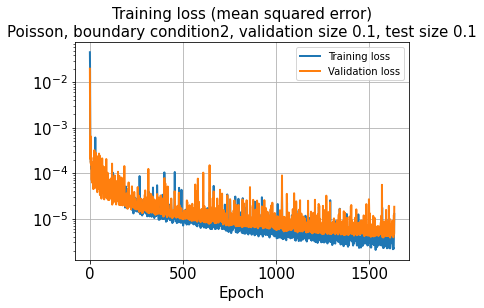

In [80]:
hist = history.history
plt.plot(hist['loss'], lw=2)
plt.plot(hist['val_loss'],lw=2)
plt.title('Training loss (mean squared error)\nPoisson, boundary condition2, validation size 0.1, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
#plt.ylim([5e-5, 1e-1])
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training loss','Validation loss'])
plt.grid()
plt.show()

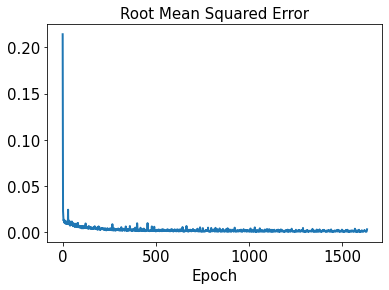

In [34]:
plt.plot(hist['rmse'], lw=2)
plt.title('Root Mean Squared Error', size=15)
plt.xlabel('Epoch', size=15)
plt.tick_params(axis='both', which='major', labelsize=15)
plt.show()

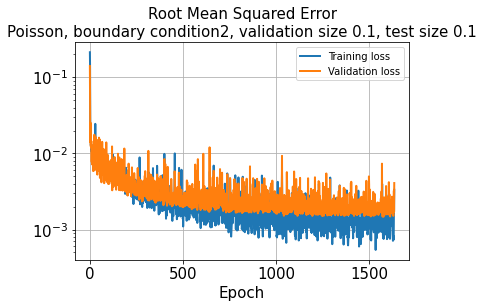

In [82]:
plt.plot(hist['rmse'], lw=2)
plt.plot(hist['val_rmse'], lw=2)
plt.title('Root Mean Squared Error\nPoisson, boundary condition2, validation size 0.1, test size 0.1', size=15)
plt.xlabel('Epoch', size=15)
plt.yscale('log')
plt.tick_params(axis='both', which='major', labelsize=15)
plt.legend(['Training loss','Validation loss'])
plt.grid()
plt.show()

In [36]:
#with mirrored_strategy.scope():
test_results = model.evaluate(x_train)

54/54 [==============================] - 0s 3ms/step - loss: 1.7681e-06 - rmse: 0.0000e+00


In [83]:
test_results = model.evaluate(x_test)

7/7 [==============================] - 0s 3ms/step - loss: 1.7681e-06 - rmse: 0.0000e+00


In [37]:
#with mirrored_strategy.scope():
decoded_train = model.predict(x_train)

54/54 [==============================] - 1s 11ms/step


In [84]:
decoded_val = model.predict(x_val)

6/6 [==============================] - 0s 74ms/step


In [38]:
#with mirrored_strategy.scope():
decoded_test = model.predict(x_test)

7/7 [==============================] - 0s 10ms/step


In [39]:
error_train_abs = np.abs(decoded_train - y_train)

In [40]:
error_test_abs = np.abs(decoded_test - y_test)

In [41]:
error_train_Cl_abs = np.abs(decoded_train[:,0,:] - y_train[:,0,:])

In [42]:
error_train_Cd_abs = np.abs(decoded_train[:,1,:] - y_train[:,1,:])

In [43]:
error_test_Cl_abs = np.abs(decoded_test[:,0,:] - y_test[:,0,:])

In [44]:
error_test_Cd_abs = np.abs(decoded_test[:,1,:] - y_test[:,1,:])

In [45]:
os.chdir("D:\\TrainedModels\\20221027")
model.save('Poisson_bc2_100kernel_2by2MaxPooling_2CNNlayer_validationSize0.1testSize0.3.h5',
           overwrite=True, include_optimizer=True, save_format='h5')

In [46]:
l2_error_train = np.sqrt(np.sum((decoded_train - y_train)**2) / np.sum(y_train**2))
print(l2_error_train)

0.0011680547993505289


In [85]:
l2_error_val = np.sqrt(np.sum((decoded_val - y_val)**2) / np.sum(y_val**2))
print(l2_error_val)

0.0023402459872186926


In [47]:
l2_error_test = np.sqrt(np.sum((decoded_test - y_test)**2) / np.sum(y_test**2))
print(l2_error_test)

0.005049971273808079


In [48]:
l2_error_train_list = []
for i in range(0, len(aa_train)):
    l2_error_train_data = np.sqrt(np.sum((decoded_train[i] - y_train[i])**2) / np.sum(y_train[i]**2))
    l2_error_train_list.append(l2_error_train_data)
print(l2_error_train_list)

[0.0020811485699630595, 0.0017400218630952578, 0.0014218241912770252, 0.0016239195572021897, 0.0012839706584998468, 0.0011342683087897758, 0.001564949917638406, 0.0010446306365004395, 0.0016152635090757293, 0.0008537531701451883, 0.0009664328812503025, 0.0008939307922319904, 0.0009435182916634324, 0.0014727006316346428, 0.0017265098560717796, 0.001315095078317347, 0.0011665236078186986, 0.0012194712961055504, 0.0011877398983621671, 0.0009094168025961835, 0.0009728006157601125, 0.0009712024658866537, 0.0011877291344327392, 0.0013224707207852855, 0.0012173640122206788, 0.0009805184761348682, 0.0008920051722270331, 0.001020106243764537, 0.0006340118681388846, 0.000977697554462896, 0.0010001730221372966, 0.0011748573663113025, 0.001229697829203373, 0.00152173967998773, 0.0015382789398391166, 0.0010676371795160795, 0.0014041532699699418, 0.0005810631044677648, 0.001472427671678973, 0.0008087349314371321, 0.0010684011331704869, 0.00071159959799443, 0.0008624769368673053, 0.000998451208025831

In [87]:
l2_error_val_list = []
for i in range(0, len(aa_val)):
    l2_error_val_data = np.sqrt(np.sum((decoded_val[i] - y_val[i])**2) / np.sum(y_val[i]**2))
    l2_error_val_list.append(l2_error_val_data)
print(l2_error_val_list)

[0.0019277199629601186, 0.001827397870196128, 0.0027789238783531437, 0.0030483436472934266, 0.0012273200168292752, 0.002072044546981884, 0.0009120394923955431, 0.0005695547814199687, 0.0007415092299225905, 0.0008104738431355301, 0.0015402847405377807, 0.000901455553785833, 0.0007298421295046882, 0.000689626720697573, 0.0009891674389152208, 0.001859957660625939, 0.0013937459816192616, 0.0006389495390347926, 0.0005422892220622713, 0.0008913458889666953, 0.001749940751488813, 0.0007799306845113042, 0.0007388604714971183, 0.002581379250871761, 0.0025682385286214388, 0.0020918166156740814, 0.0020980291742231354, 0.0021967818582981622, 0.0022722019733455814, 0.0029752875617813897, 0.001652783599300432, 0.0015572681231097753, 0.004098634970591614, 0.0014911873166815377, 0.0042919156696232365, 0.005634422239423498, 0.002141105733962472, 0.0011381781446273766, 0.005948288173220834, 0.0011607459259352386, 0.0069205849122214455, 0.003027667473712037, 0.0011389942229768843, 0.0042050552860593265, 

In [49]:
l2_error_test_list = []
for i in range(0, len(aa_test)):
    l2_error_test_data = np.sqrt(np.sum((decoded_test[i] - y_test[i])**2) / np.sum(y_test[i]**2))
    l2_error_test_list.append(l2_error_test_data)
print(l2_error_test_list)

[0.00096611087267819, 0.0006345360781623522, 0.0009965186247492108, 0.0010331760691959999, 0.0013618090915414125, 0.0008637903690187761, 0.0005515661824719625, 0.001410494281005979, 0.0010220799945881175, 0.001729121074134182, 0.0013242300172773705, 0.0010849746033616814, 0.0017992294390913556, 0.0014021299286995723, 0.0013289086752188712, 0.0015812445737782602, 0.0024505358649988362, 0.0022451188901523875, 0.0027450489214610897, 0.003804274568863316, 0.0030487101306215583, 0.0023596426008008465, 0.004259806700629235, 0.0027900928589206777, 0.005482151519485745, 0.002489158356657338, 0.0005854883293198547, 0.00370217573940721, 0.0015011876633903073, 0.006393941044930288, 0.0015928166664487375, 0.002406574409330235, 0.0020093315415507735, 0.0009143543425552813, 0.0015791893797318113, 0.0005197351810099103, 0.0014615526170831076, 0.0009407693785606151, 0.0007644253464811903, 0.0005480522656539376, 0.0014590334455363198, 0.0006826493310409841, 0.0006971152095809601, 0.0006149183994795974,

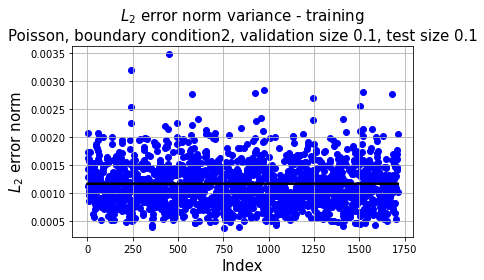

In [50]:
plt.plot(np.linspace(1, aa_train.shape[0], aa_train.shape[0]),
         l2_error_train*np.ones(aa_train.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_train.shape[0], aa_train.shape[0]), l2_error_train_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - training\nPoisson, boundary condition2, validation size 0.1, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

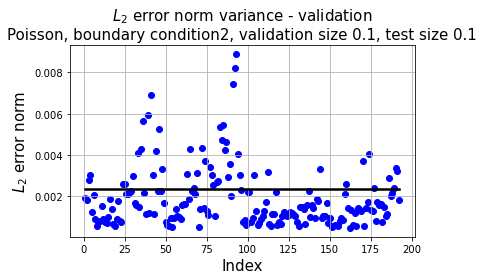

In [102]:
plt.plot(np.linspace(1, aa_val.shape[0], aa_val.shape[0]),
         l2_error_val*np.ones(aa_val.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_val.shape[0], aa_val.shape[0]), l2_error_val_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - validation\nPoisson, boundary condition2, validation size 0.1, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

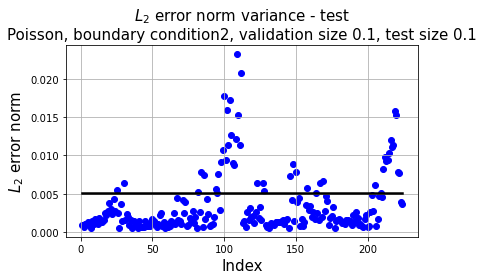

In [51]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.title('$L_2$ error norm variance - test\nPoisson, boundary condition2, validation size 0.1, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

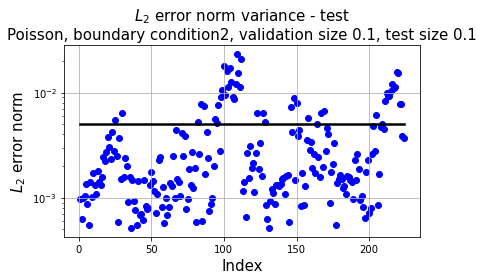

In [52]:
plt.plot(np.linspace(1, aa_test.shape[0], aa_test.shape[0]),
         l2_error_test*np.ones(aa_test.shape[0],), 'k', lw=2.5)
plt.scatter(np.linspace(1, aa_test.shape[0], aa_test.shape[0]), l2_error_test_list, c='b')
plt.xlabel('Index', fontsize=15)
plt.ylabel('$L_2$ error norm', fontsize=15)
plt.yscale('log')
plt.title('$L_2$ error norm variance - test\nPoisson, boundary condition2, validation size 0.1, test size 0.1', fontsize=15)
plt.grid()
plt.tight_layout()
plt.show()

In [53]:
os.chdir("D:\\CNN_poisson_files\\images\\validationSize0.1testSize0.1")

In [54]:
n_grid=101

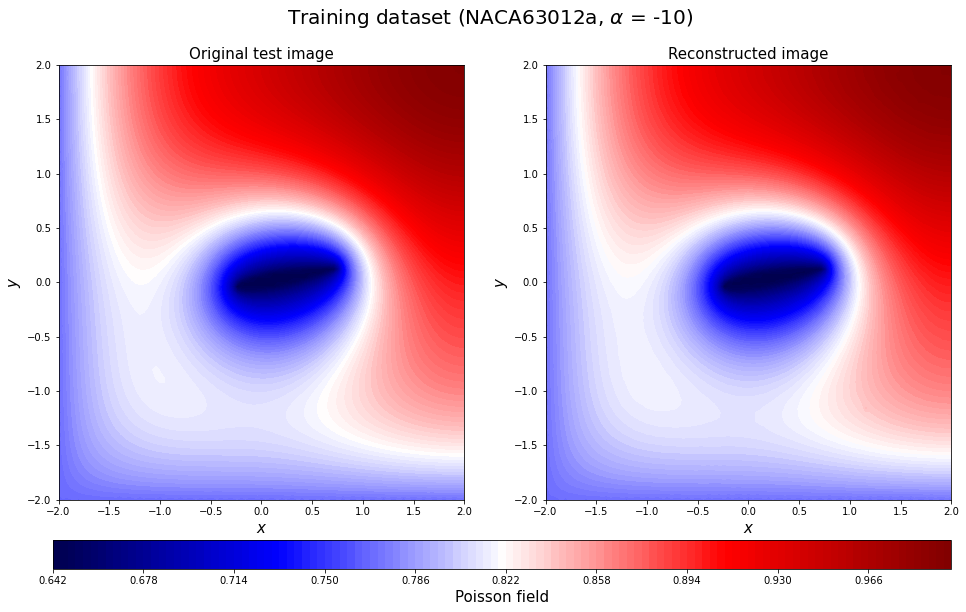

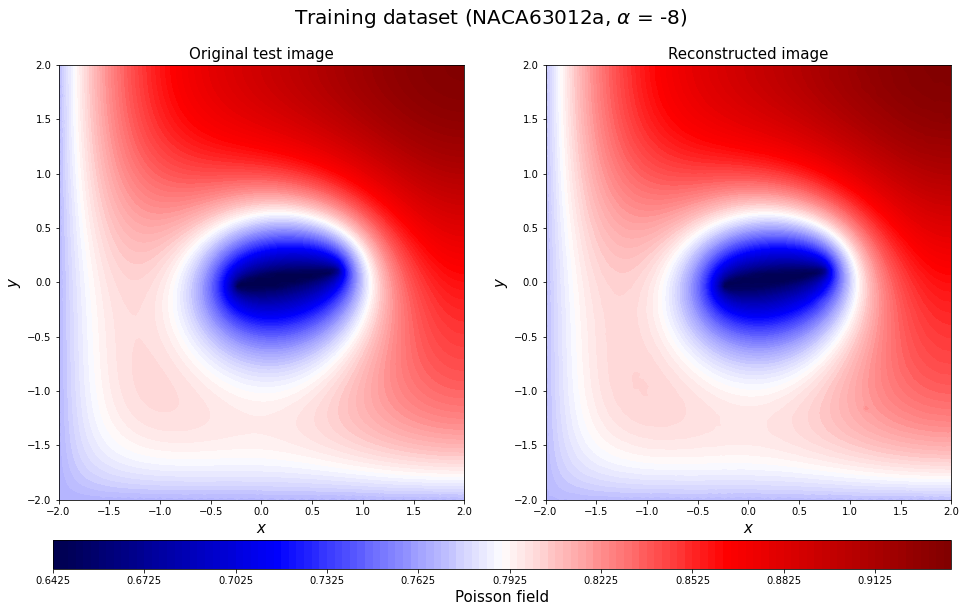

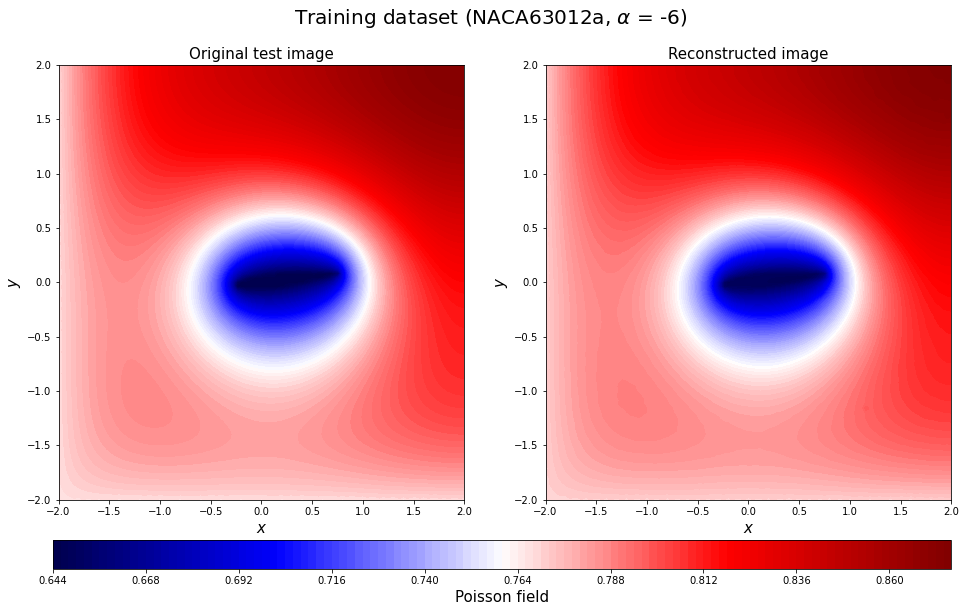

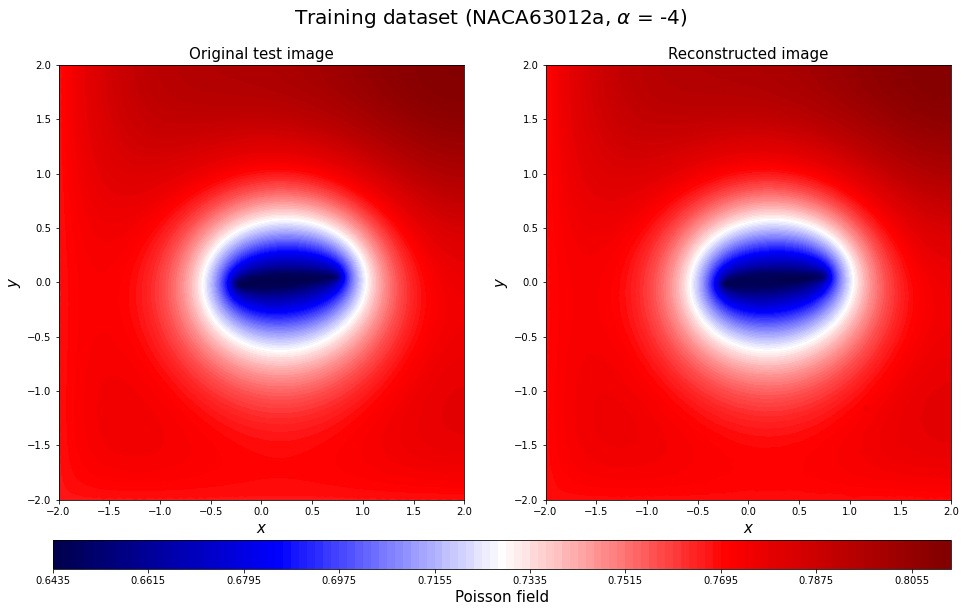

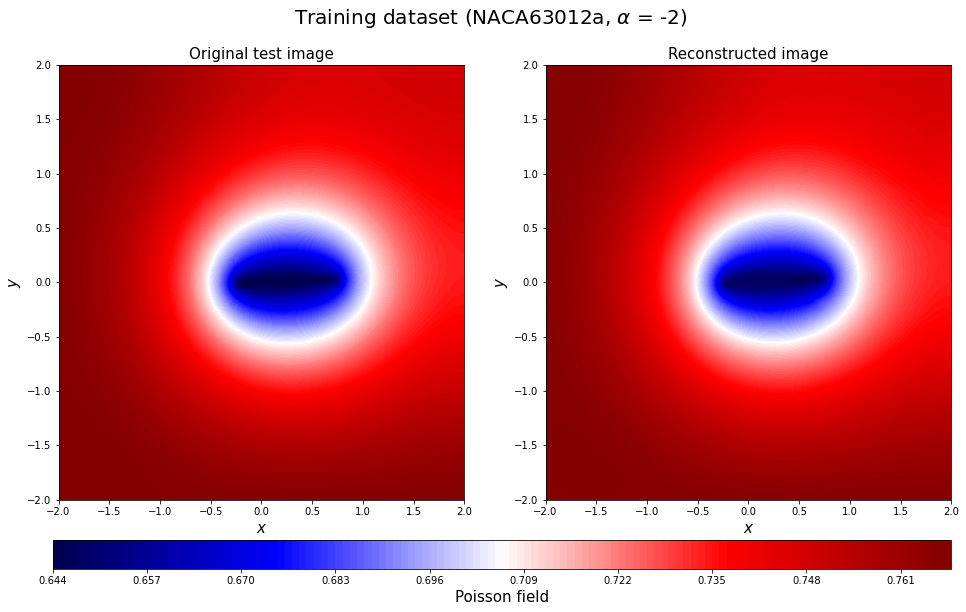

...

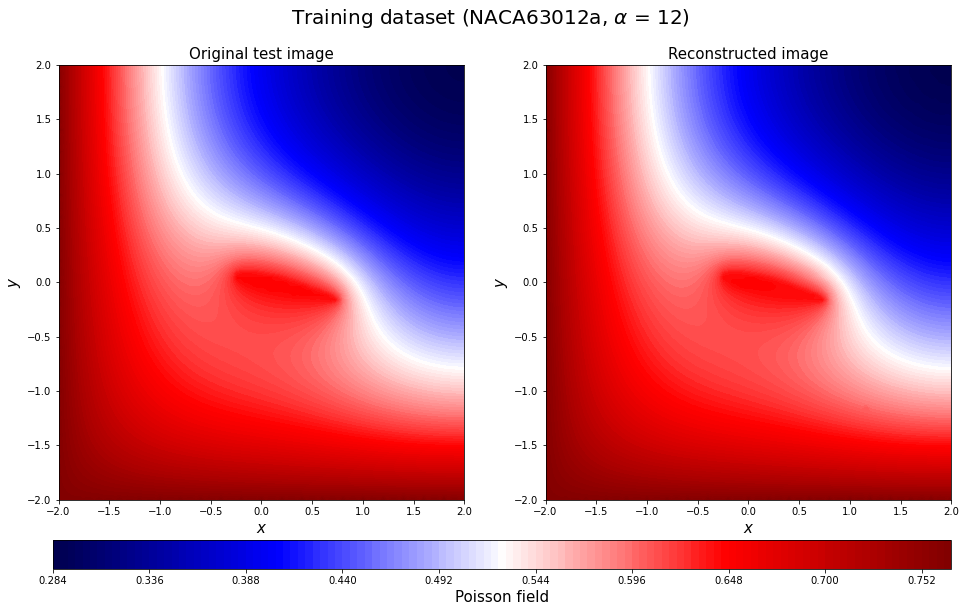

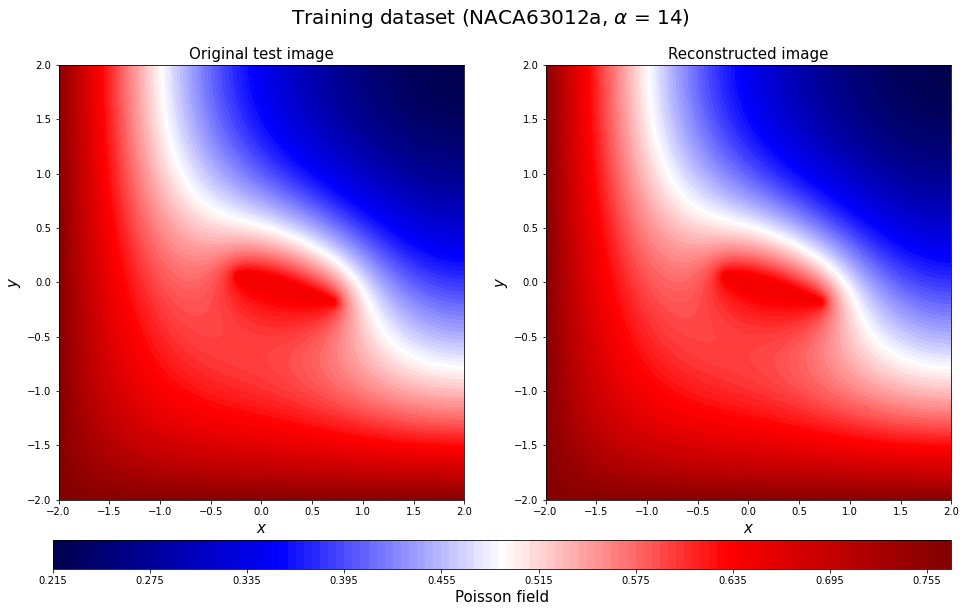

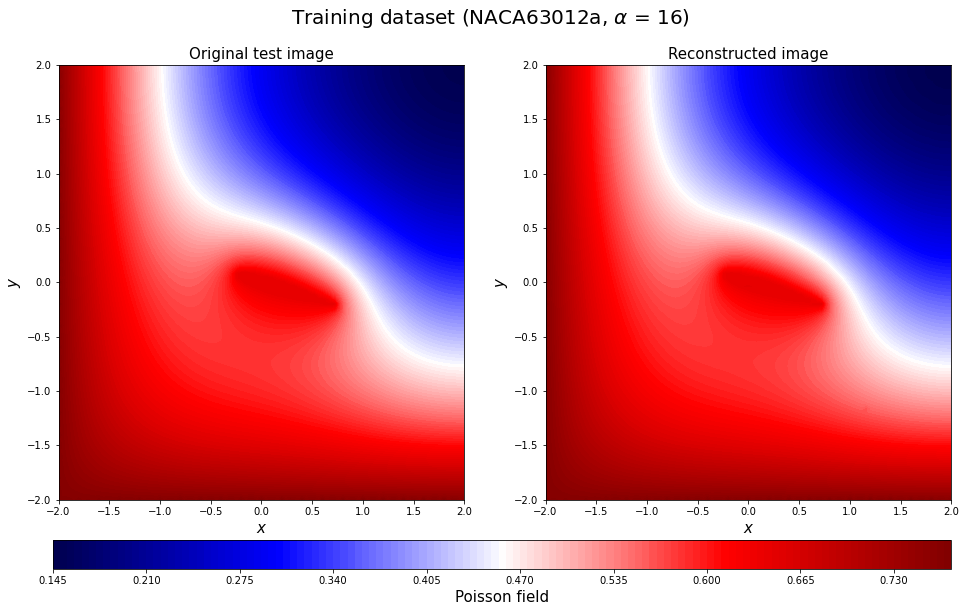

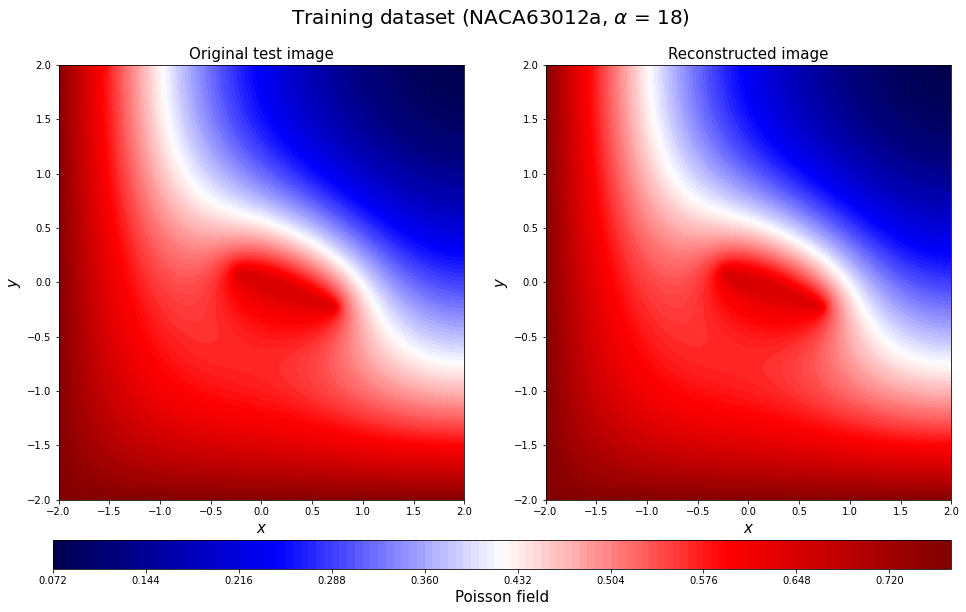

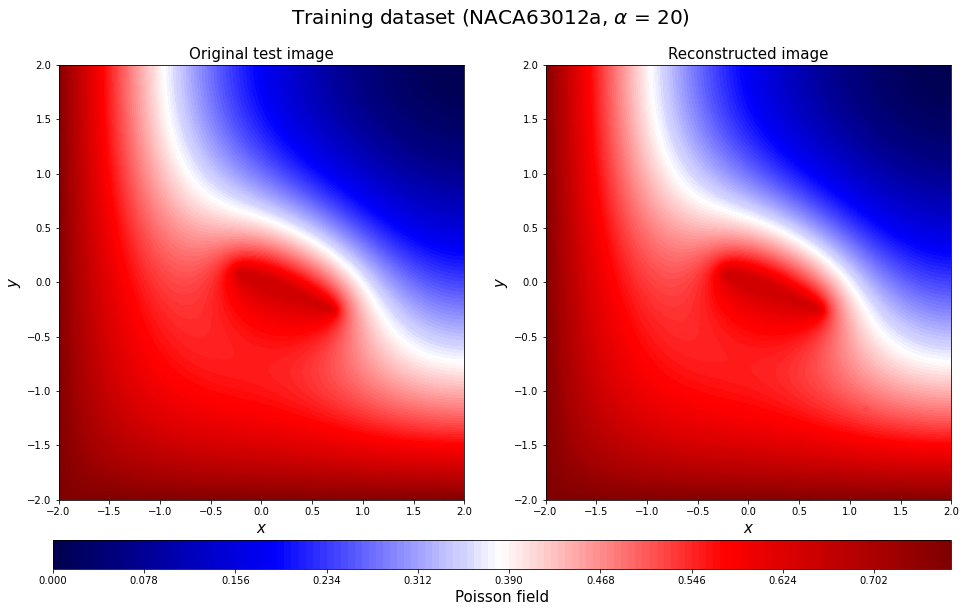

In [55]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train0_rotate = y_train[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train0_rotate,levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[c])[3:-2], aa_train[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

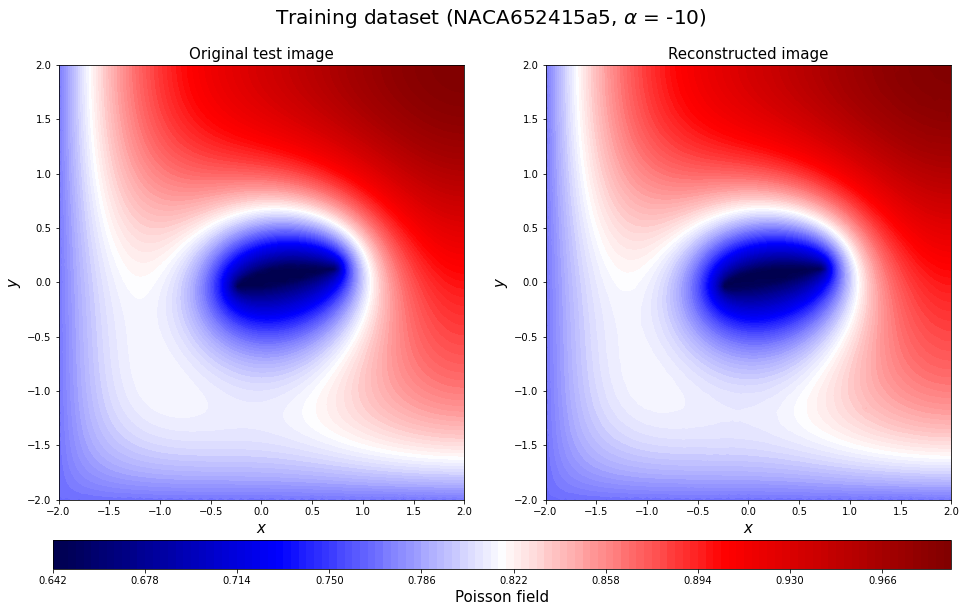

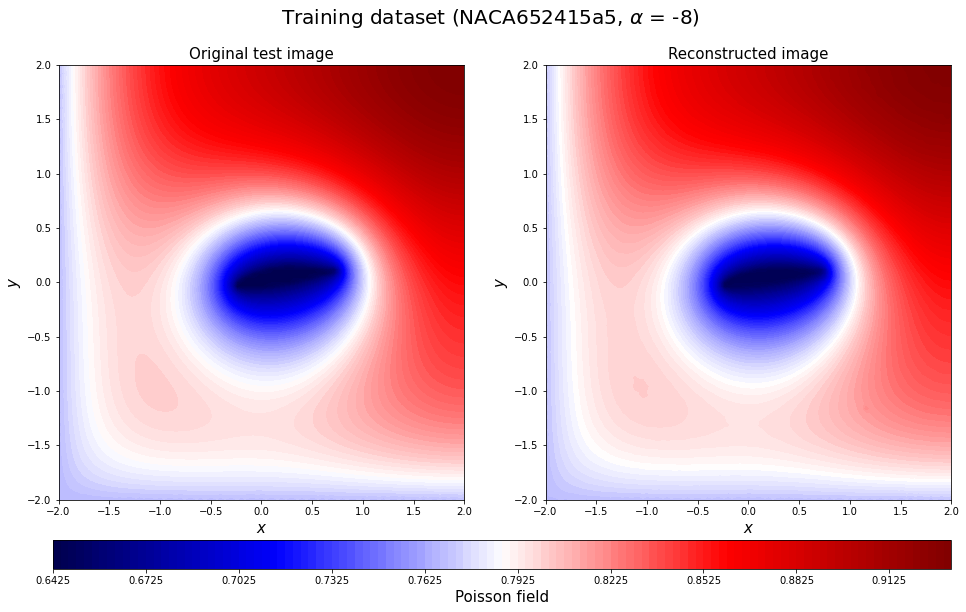

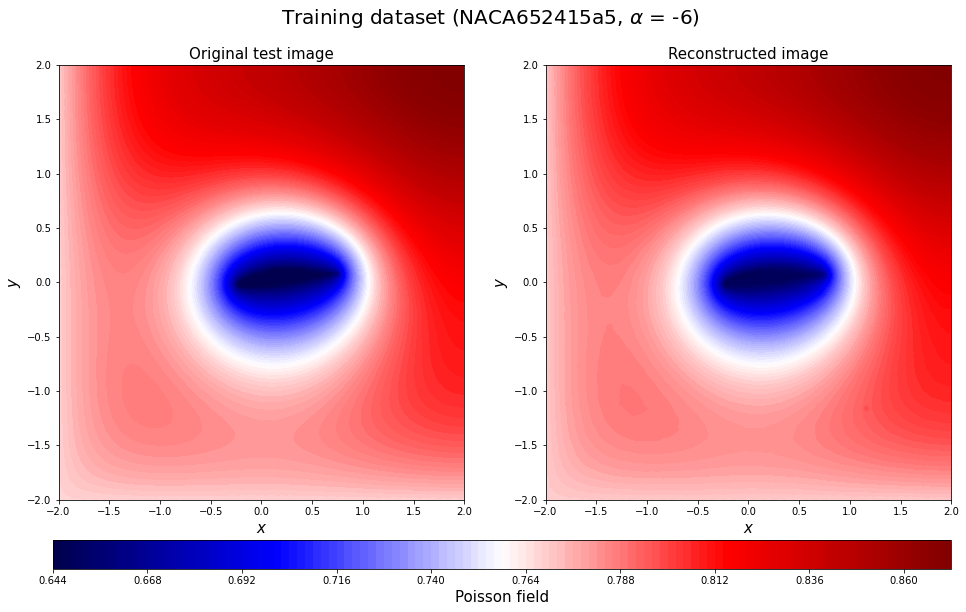

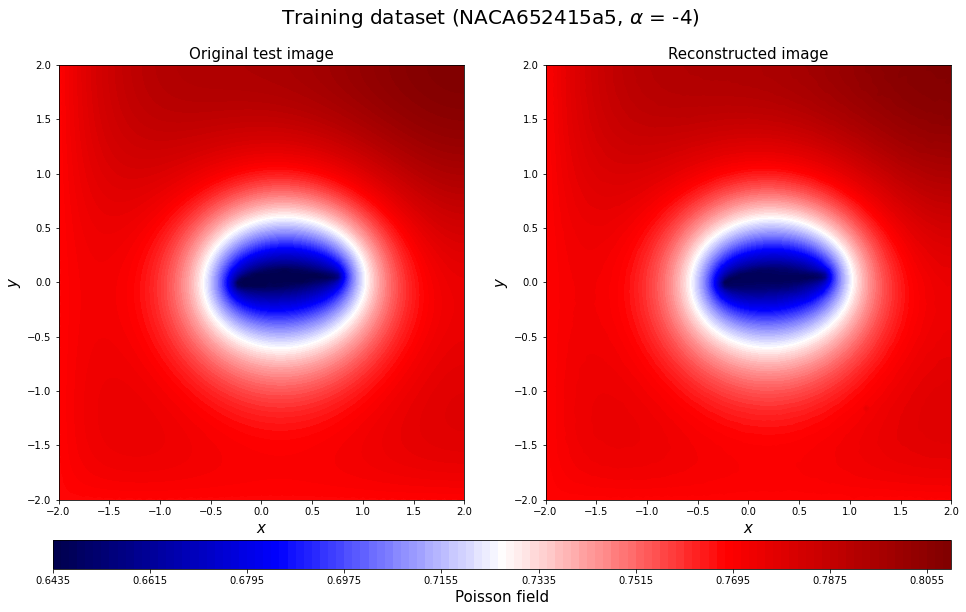

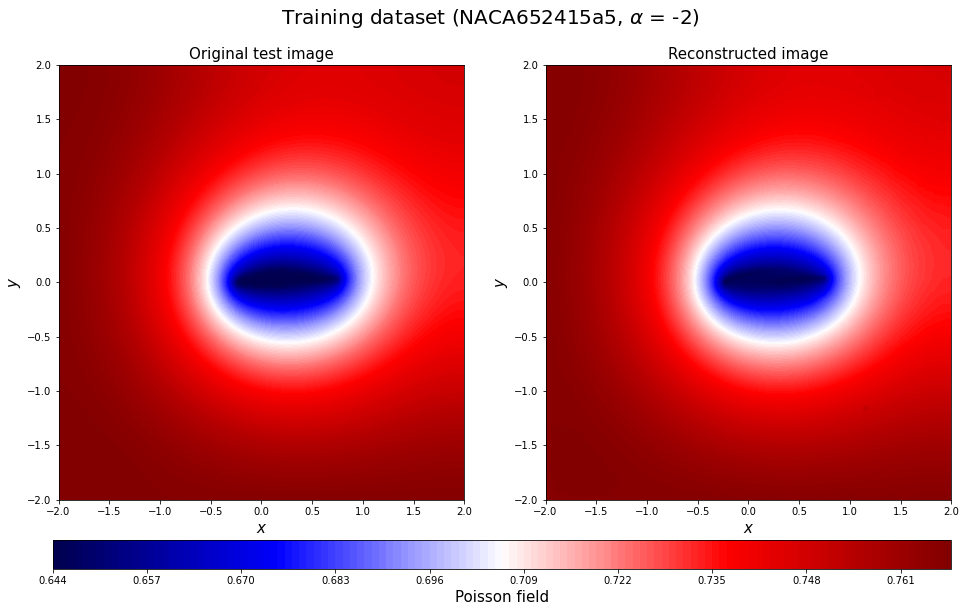

...

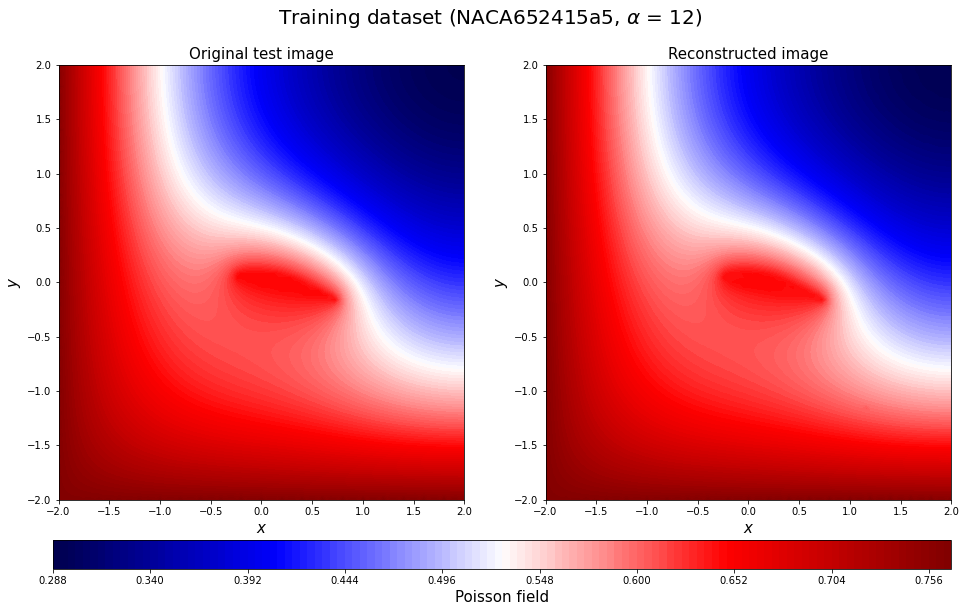

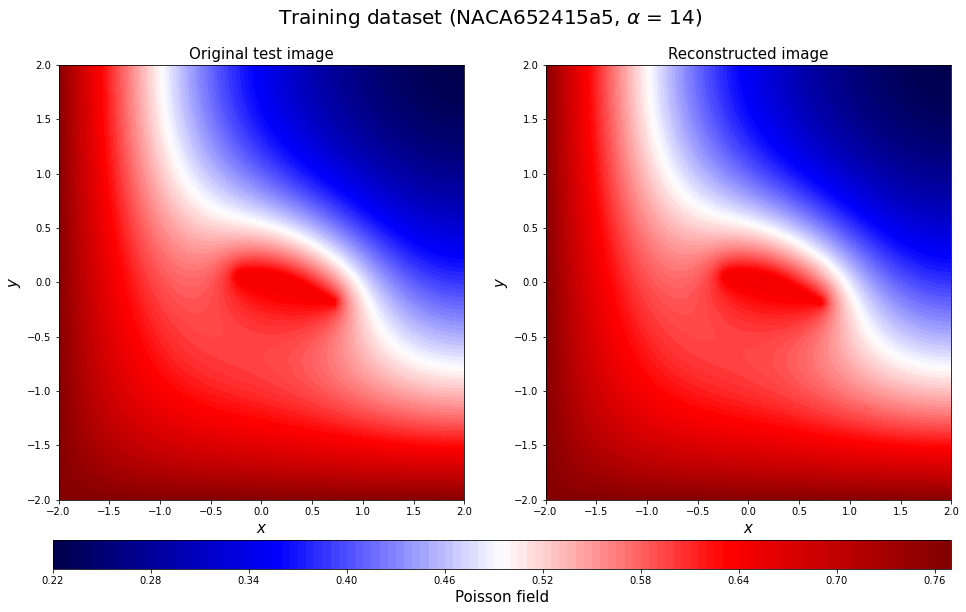

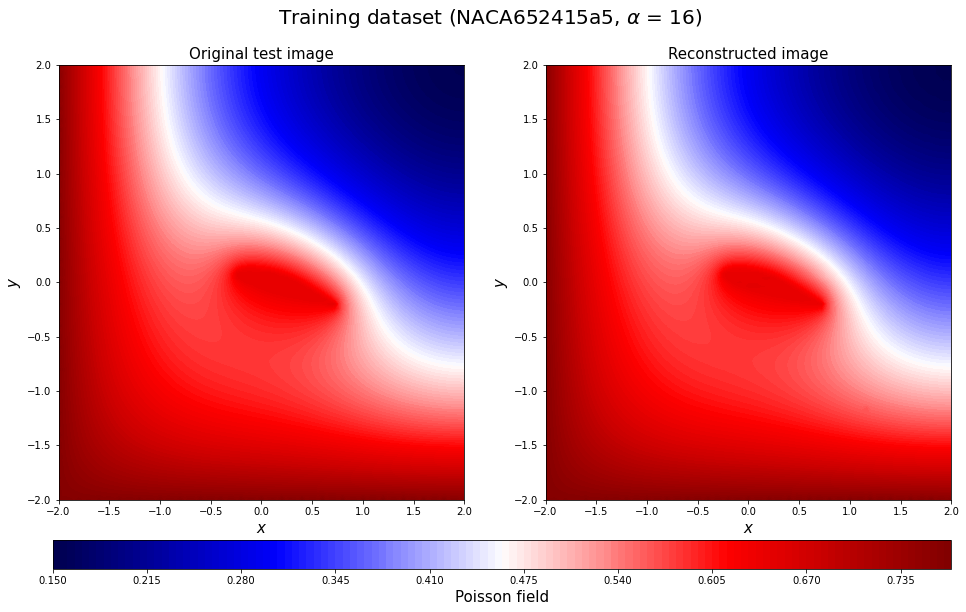

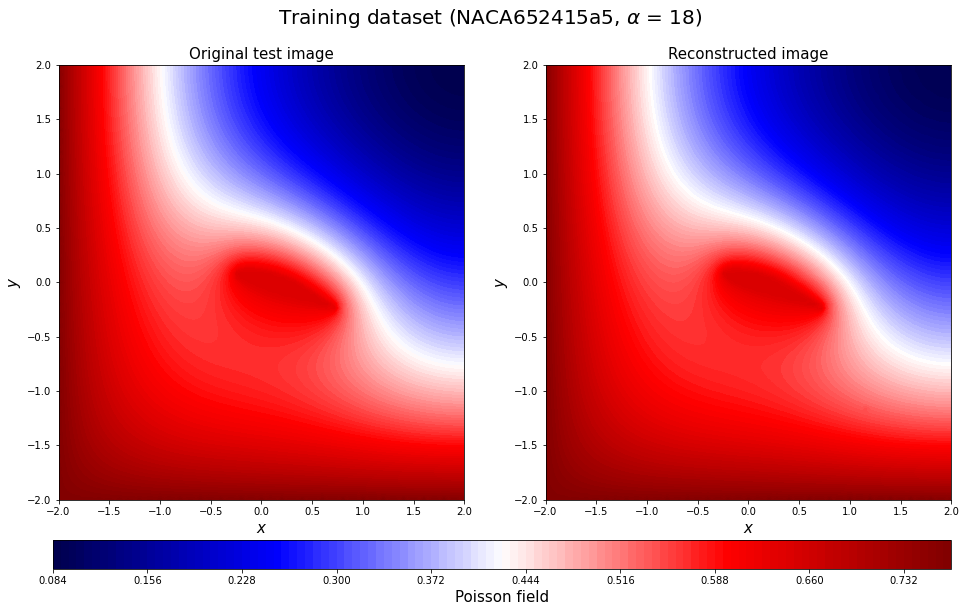

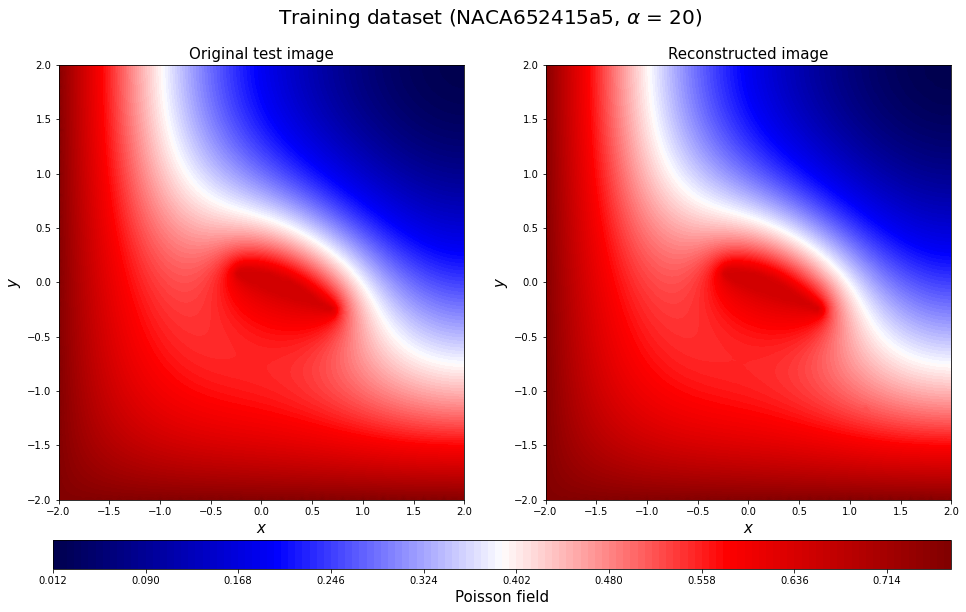

In [56]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_train20_rotate = y_train[20*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_train[20*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_train20_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Training dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_train[20*16+c])[3:-2], aa_train[20*16+c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(training)"+str(np.array2string(geo_train[20*16+c])[3:-2])+str(aa_train[20*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

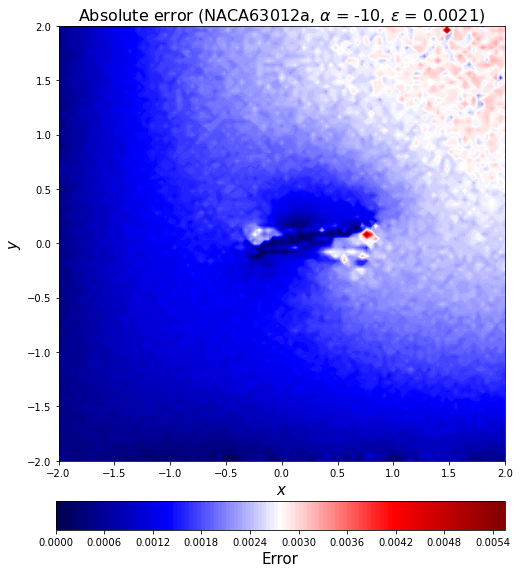

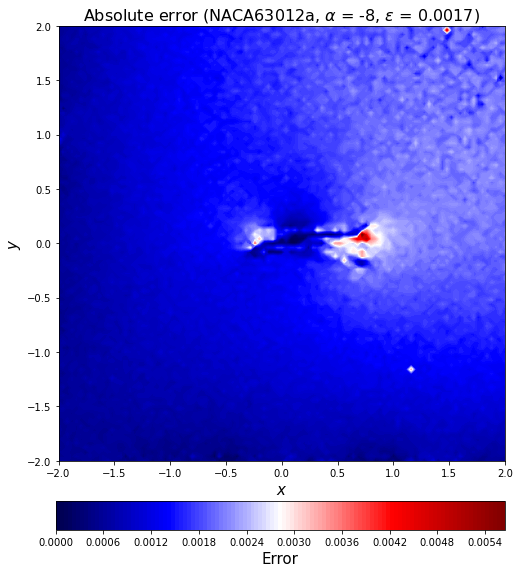

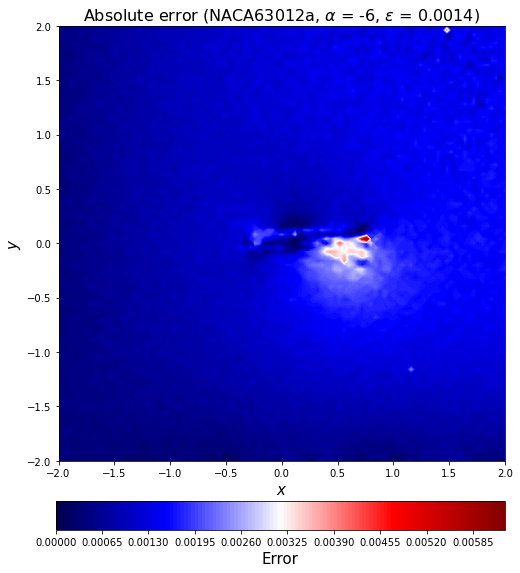

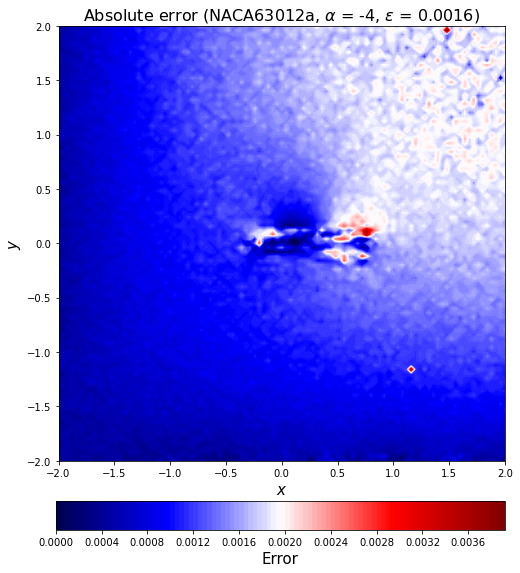

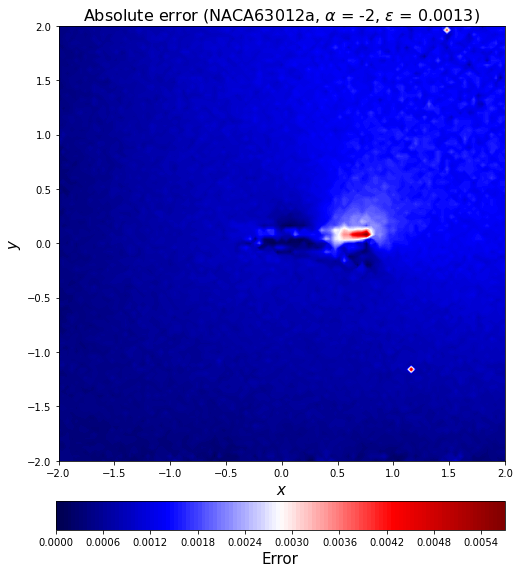

...

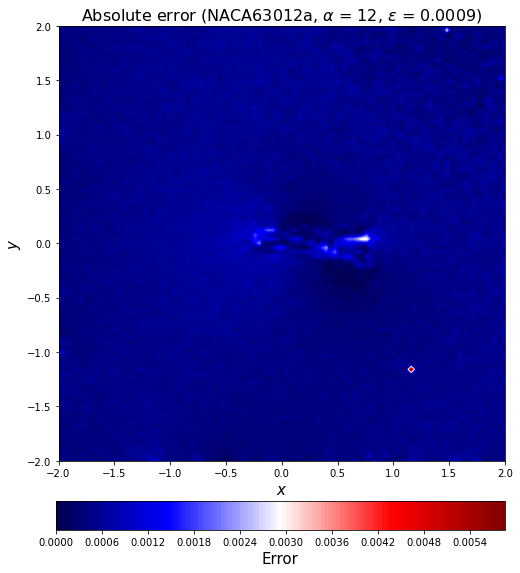

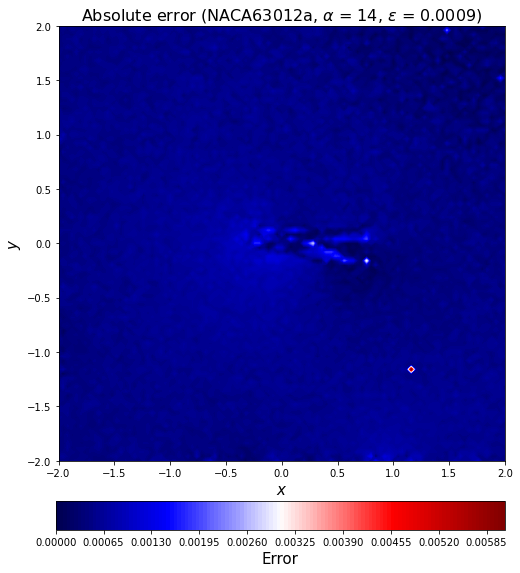

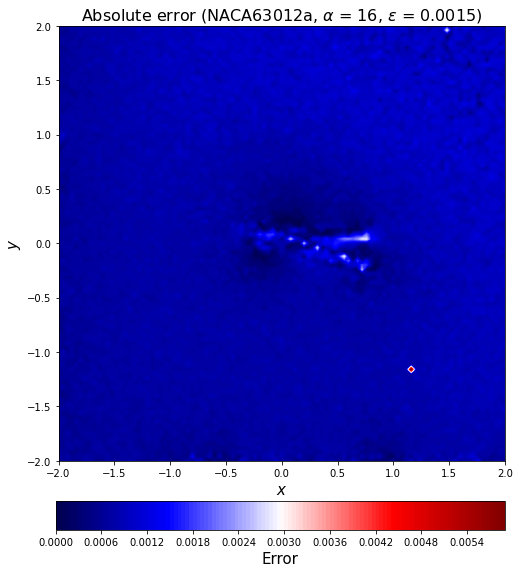

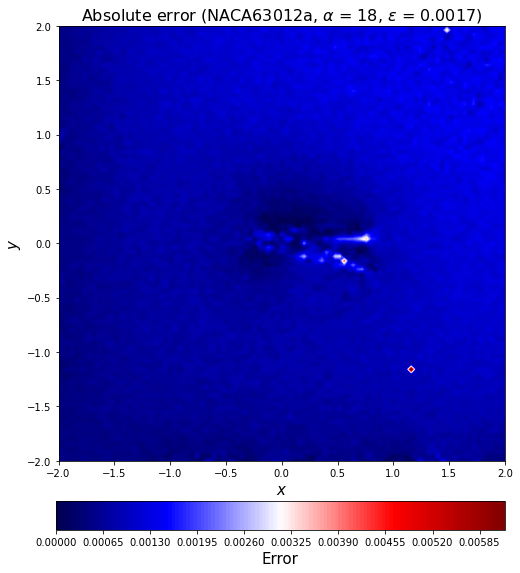

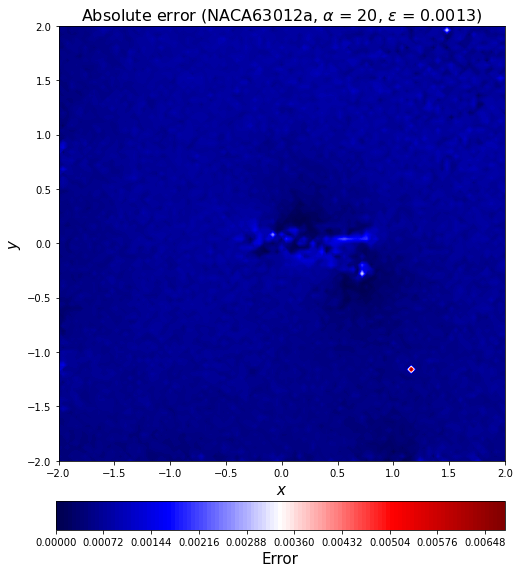

In [57]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[c])[3:-2],
                                                                             aa_train[c], l2_error_train_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[c])[3:-2])+str(aa_train[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

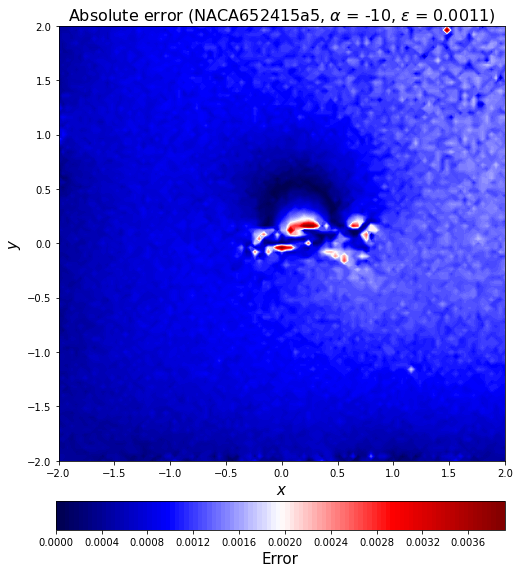

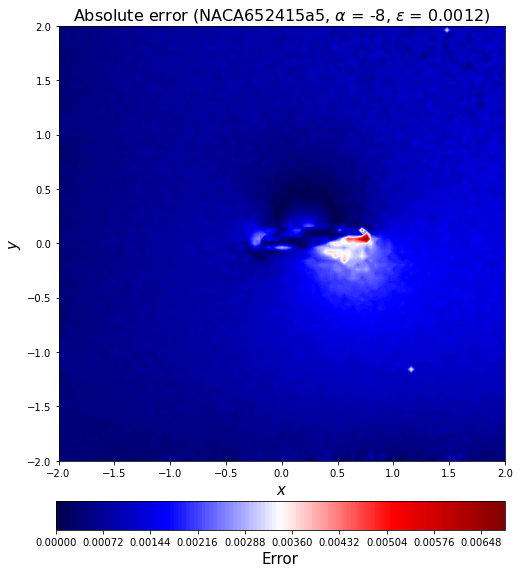

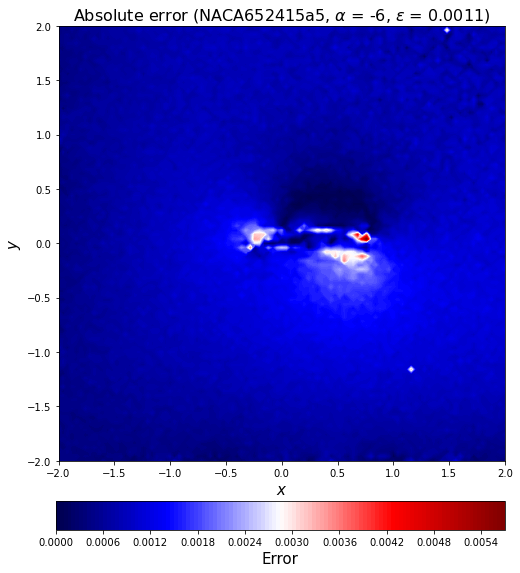

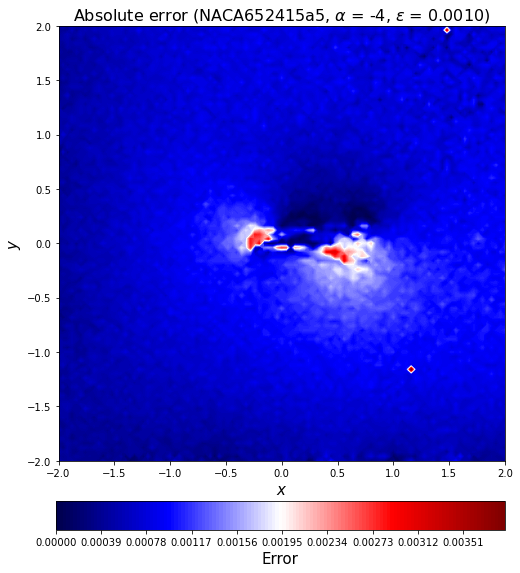

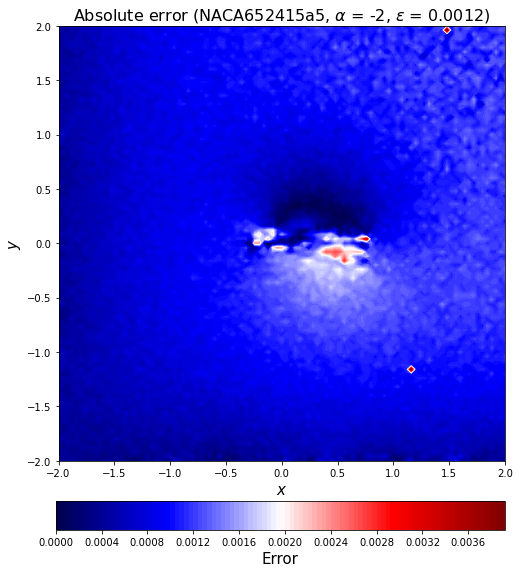

...

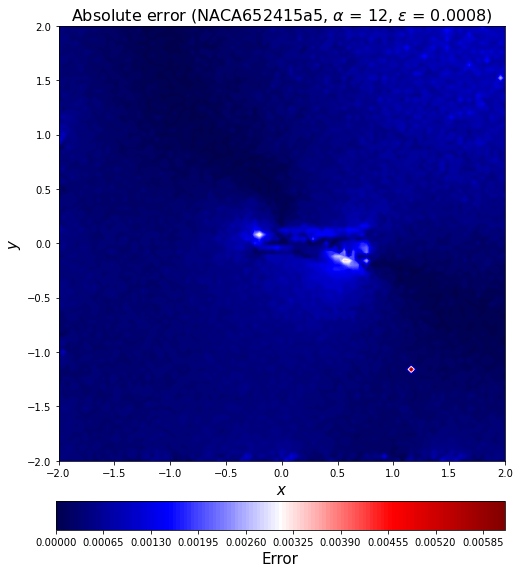

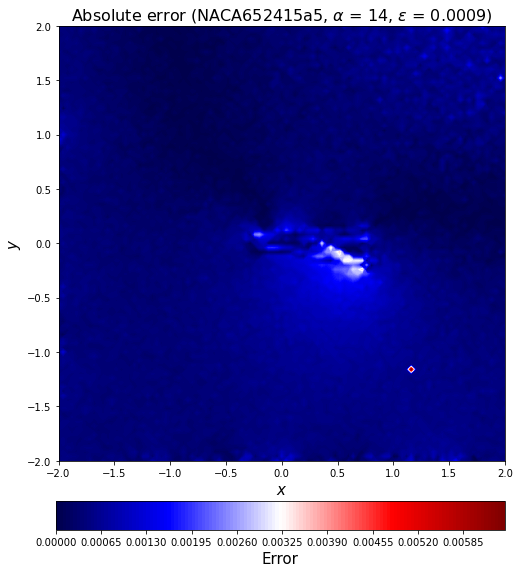

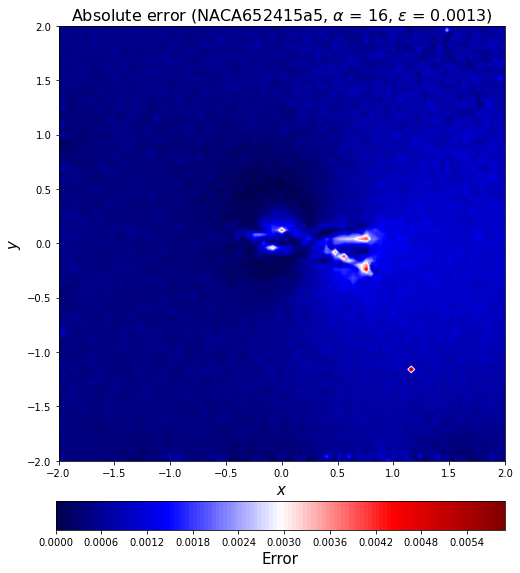

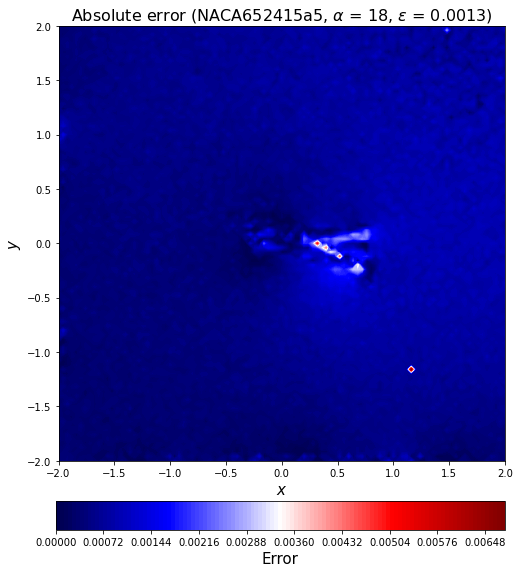

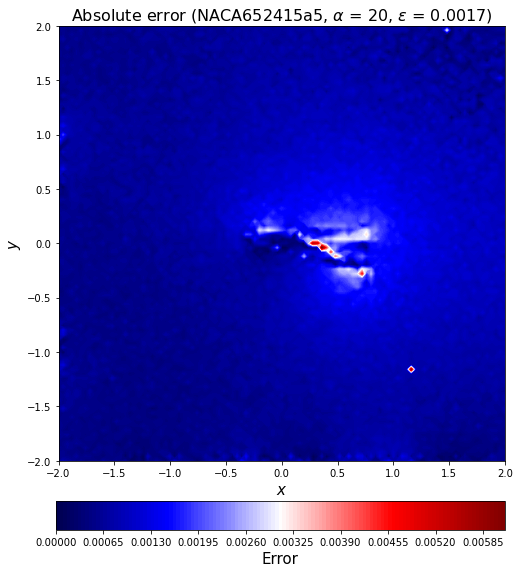

In [58]:
for c in range(0,16):
    error_train_abs2_rotate = error_train_abs[16*20+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_train_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_train[16*20+c])[3:-2],
                                                                             aa_train[16*20+c], l2_error_train_list[16*20+c]),fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(training)"+str(np.array2string(geo_train[16*20+c])[3:-2])+str(aa_train[16*20+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

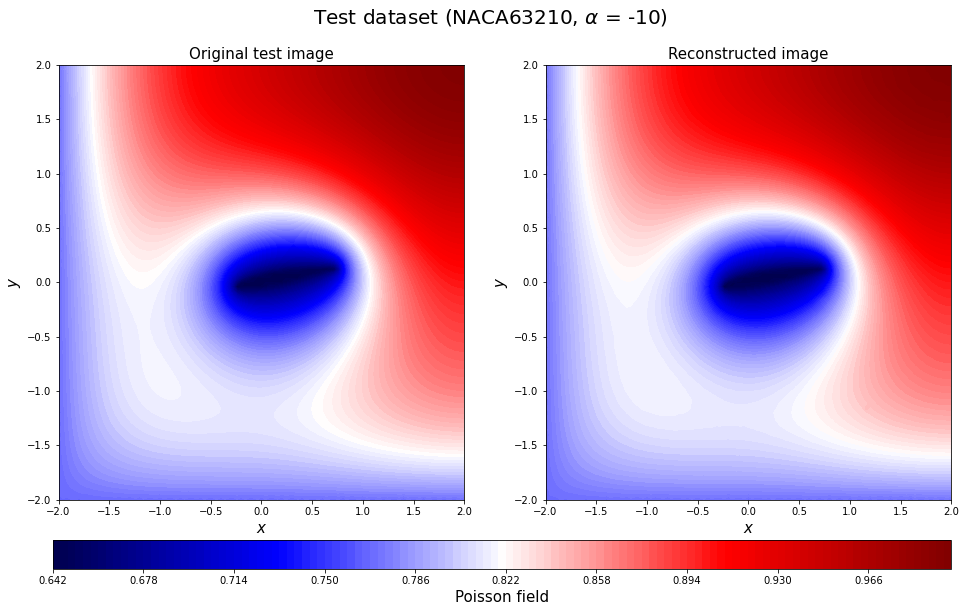

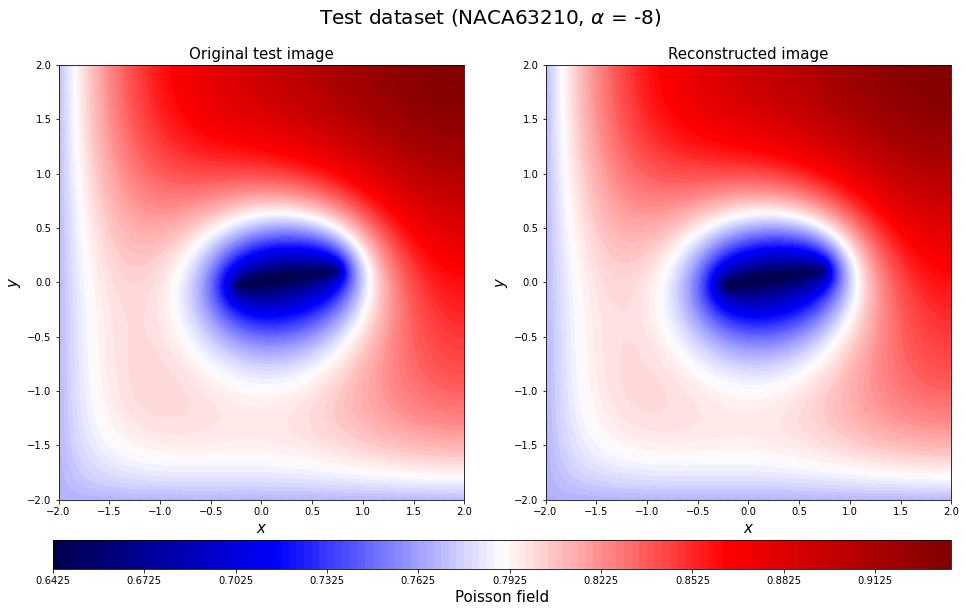

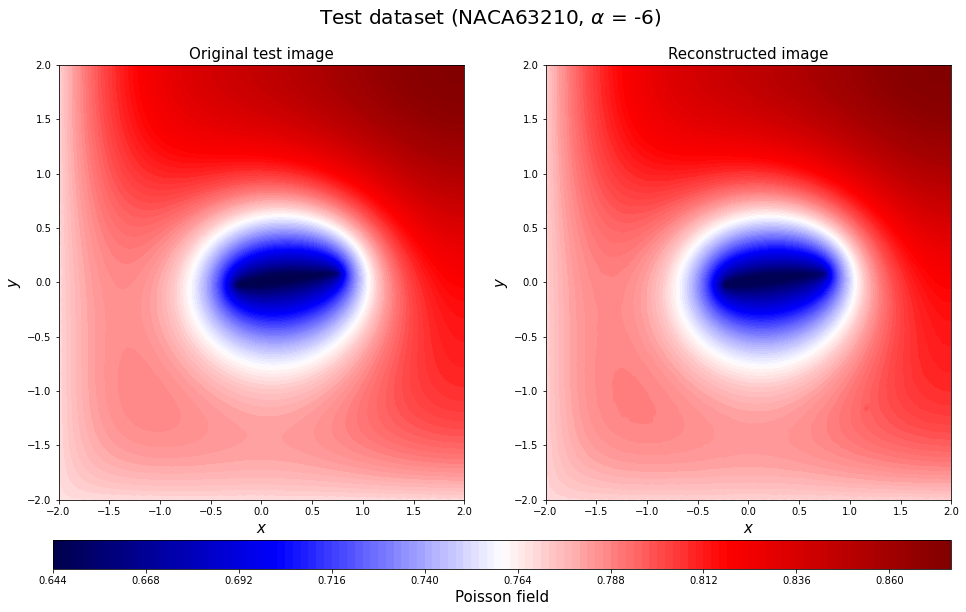

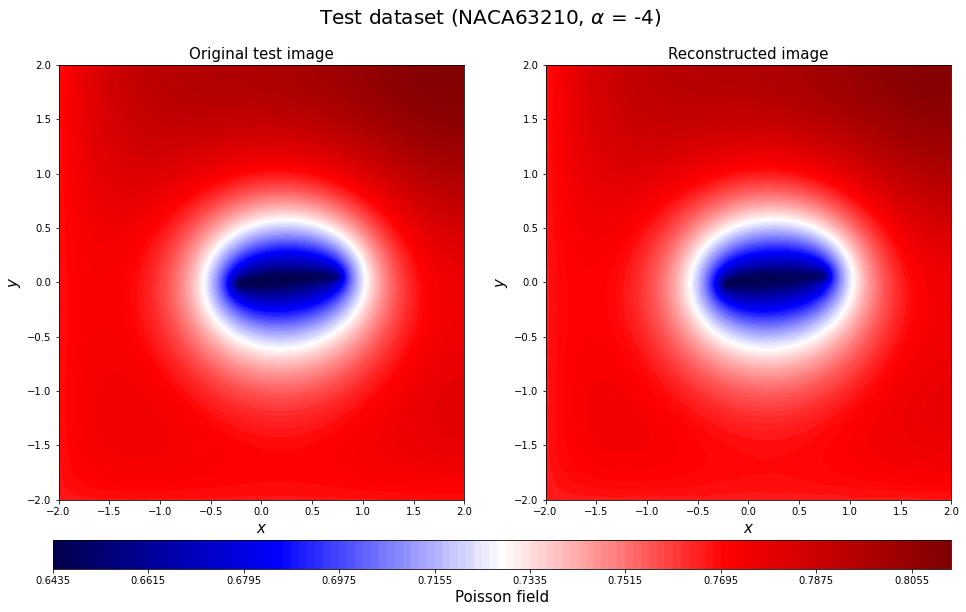

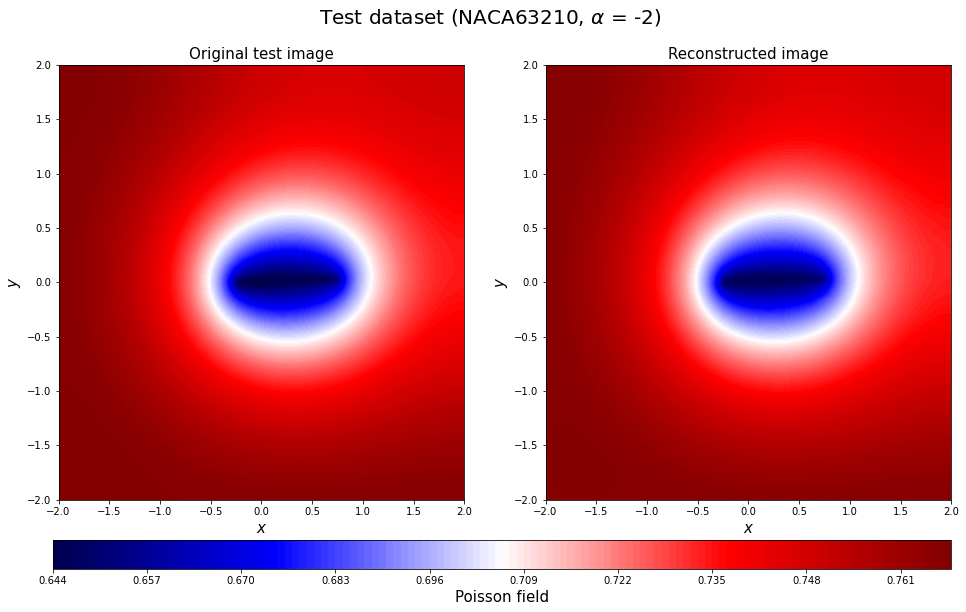

...

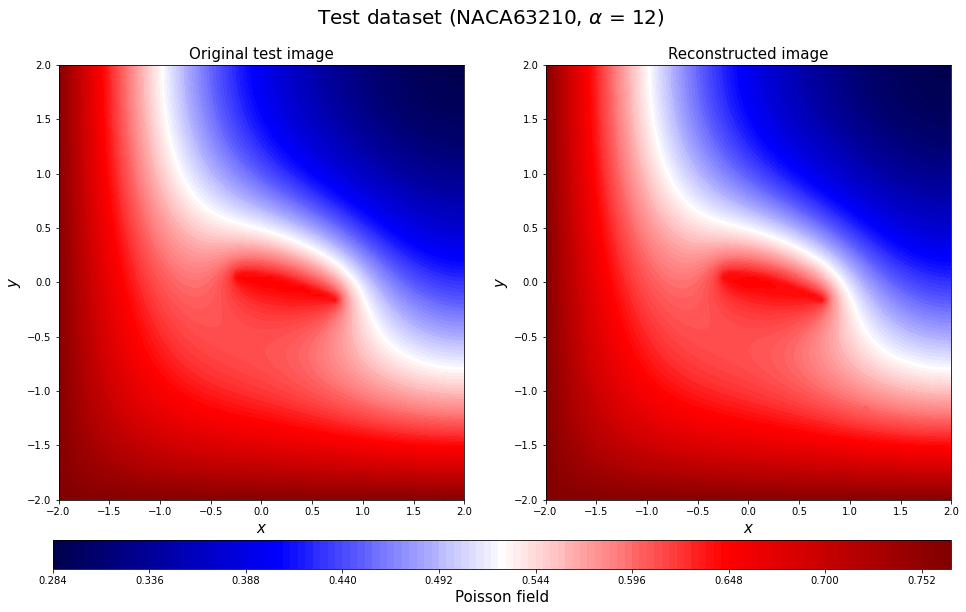

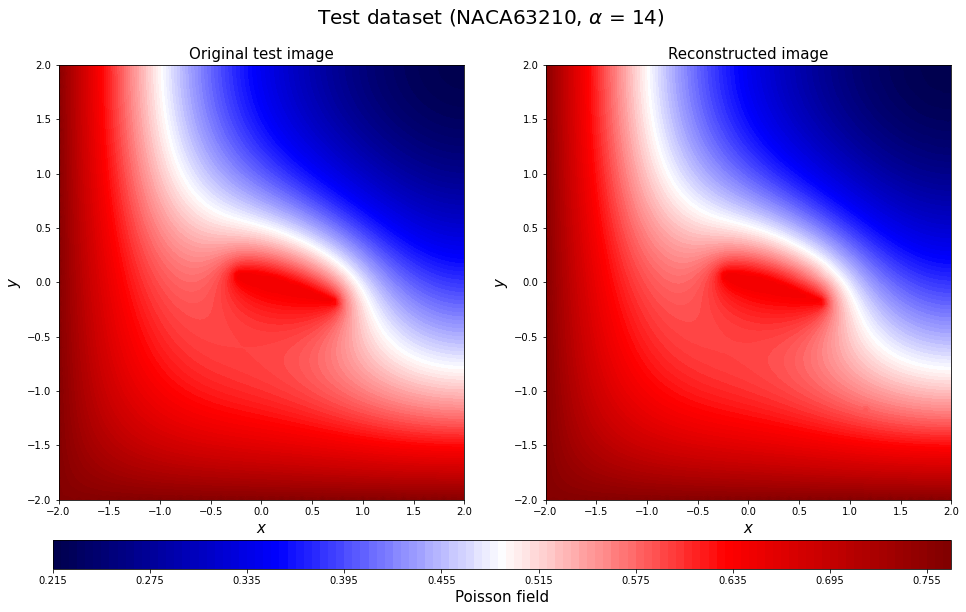

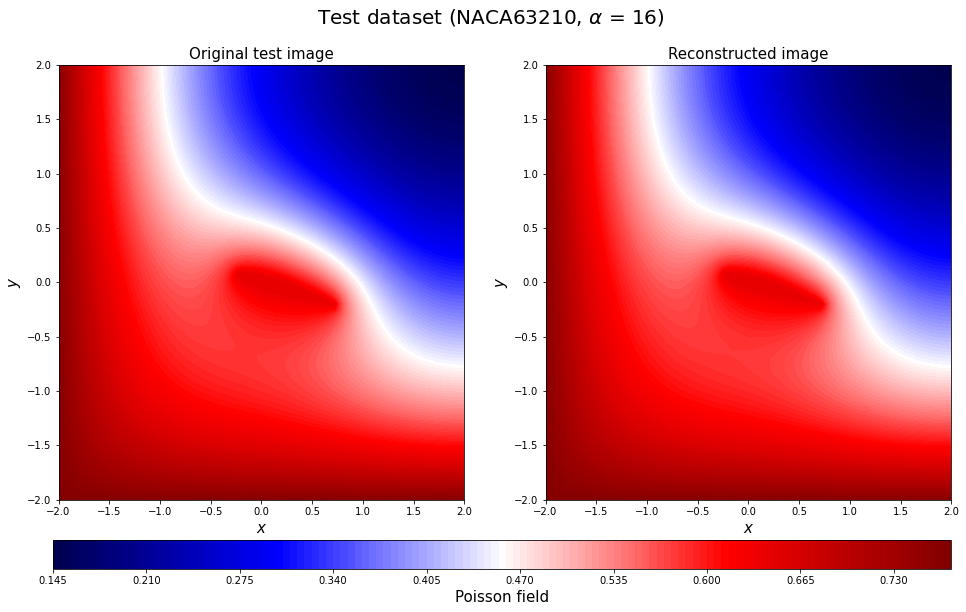

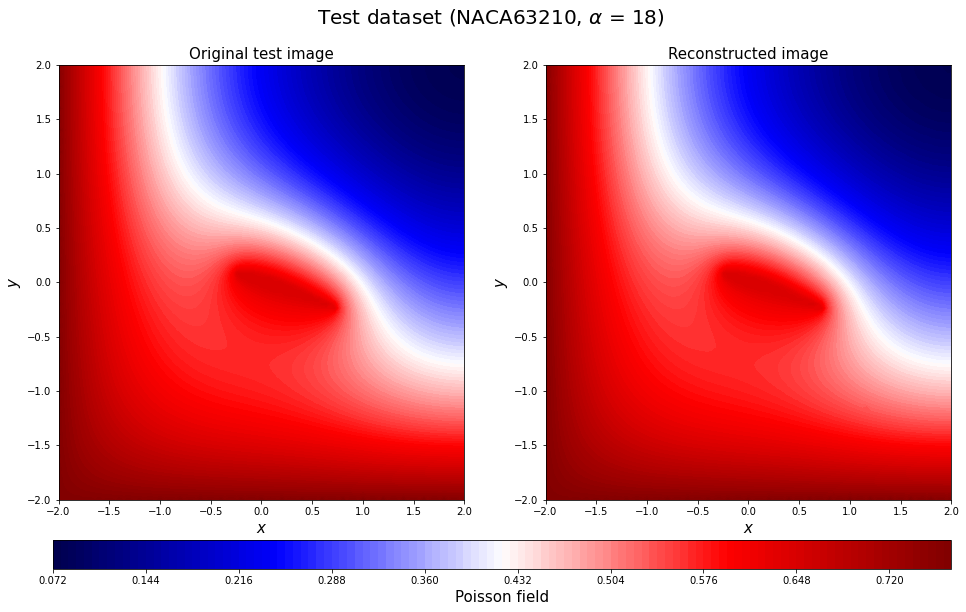

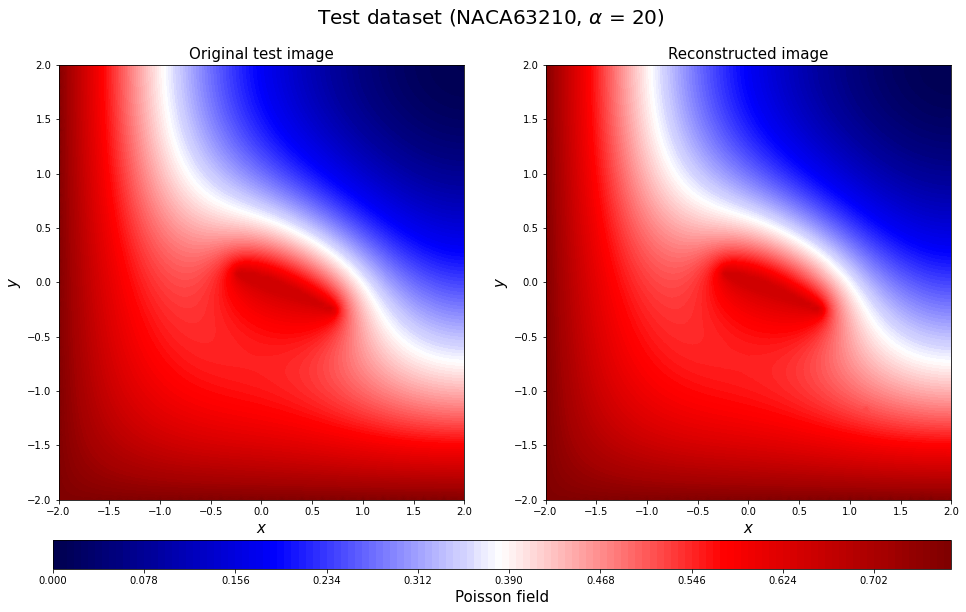

In [59]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test2_rotate = y_test[2*16+c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[2*16+c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test2_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[2*16+c])[3:-2], aa_test[2*16+c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

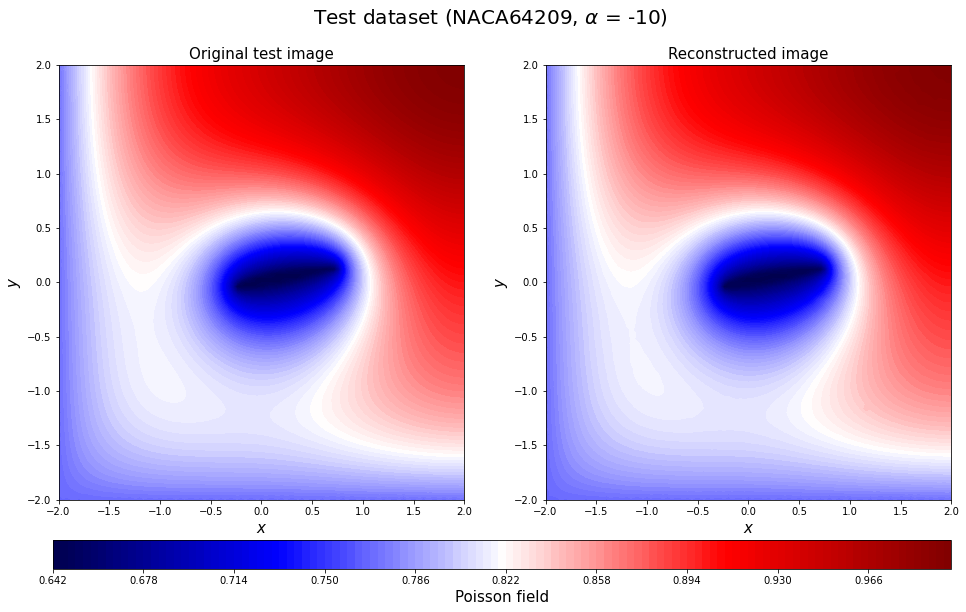

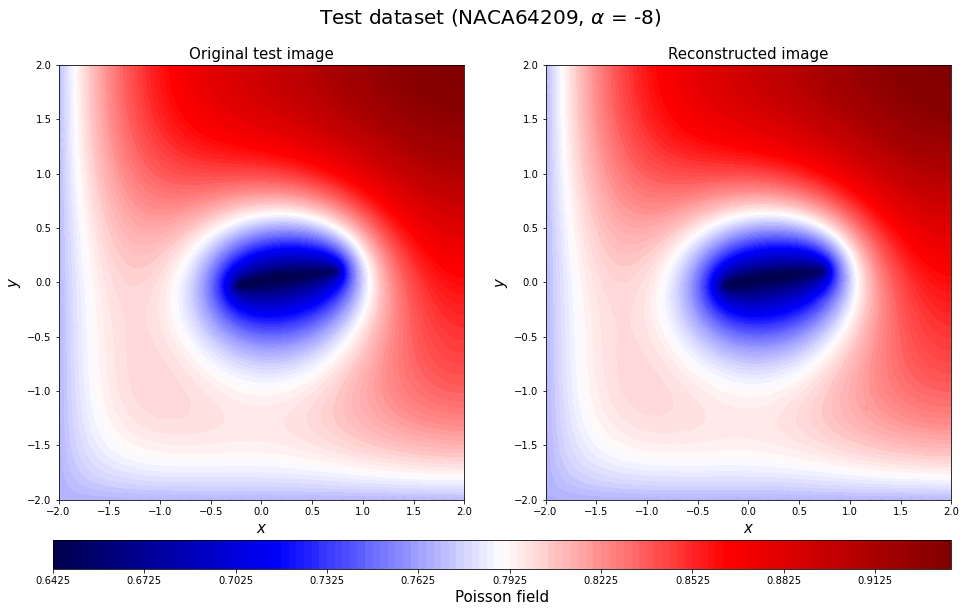

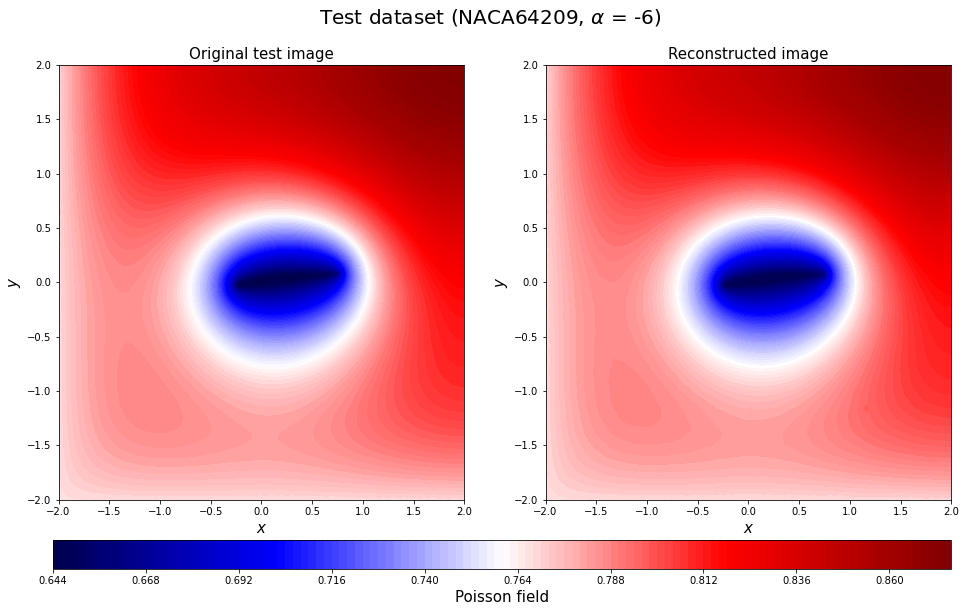

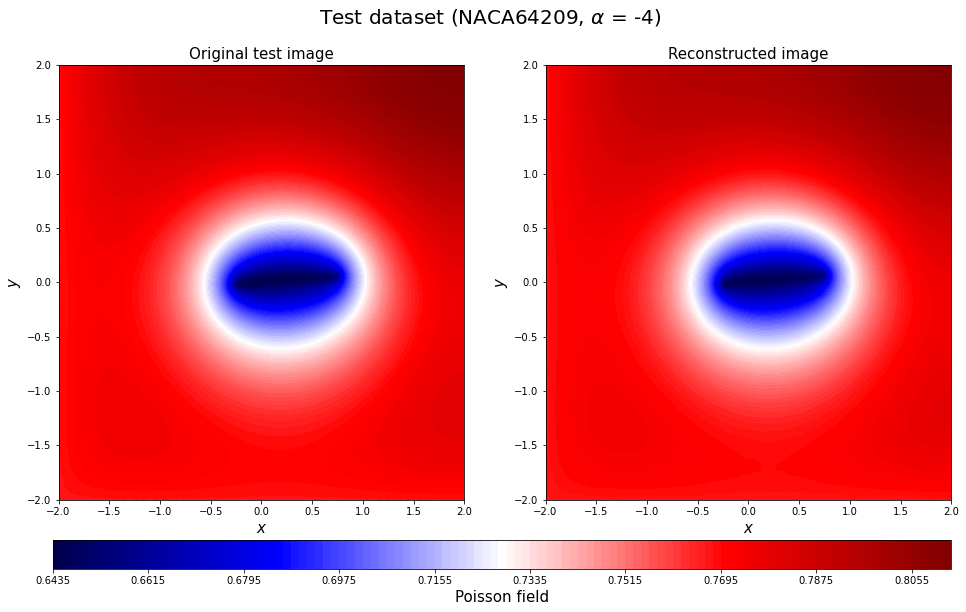

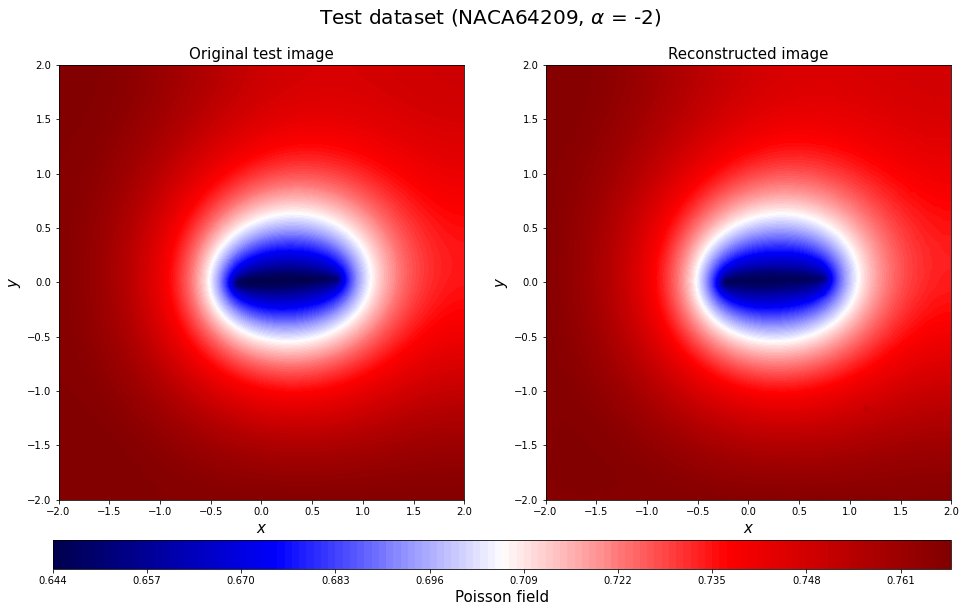

...

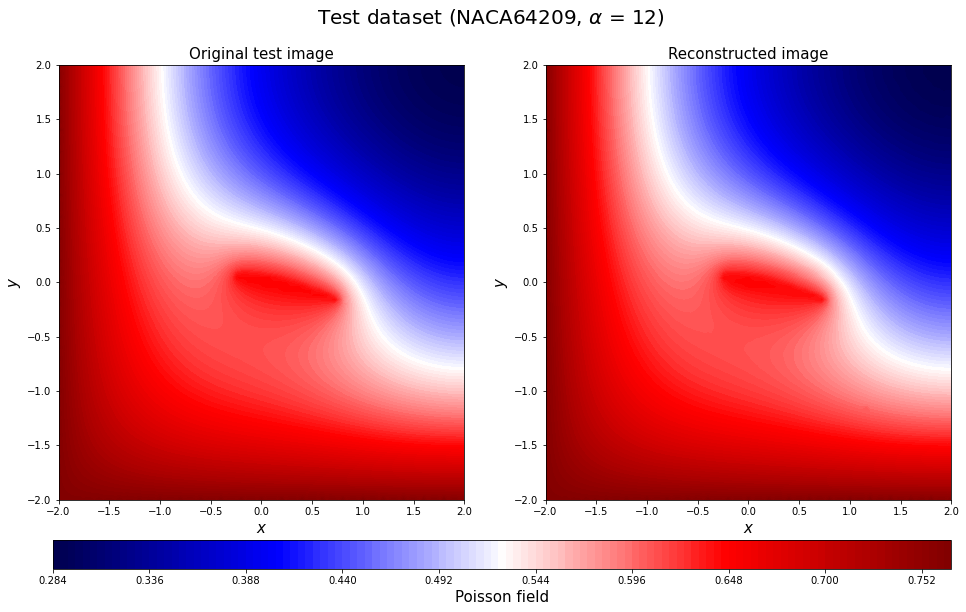

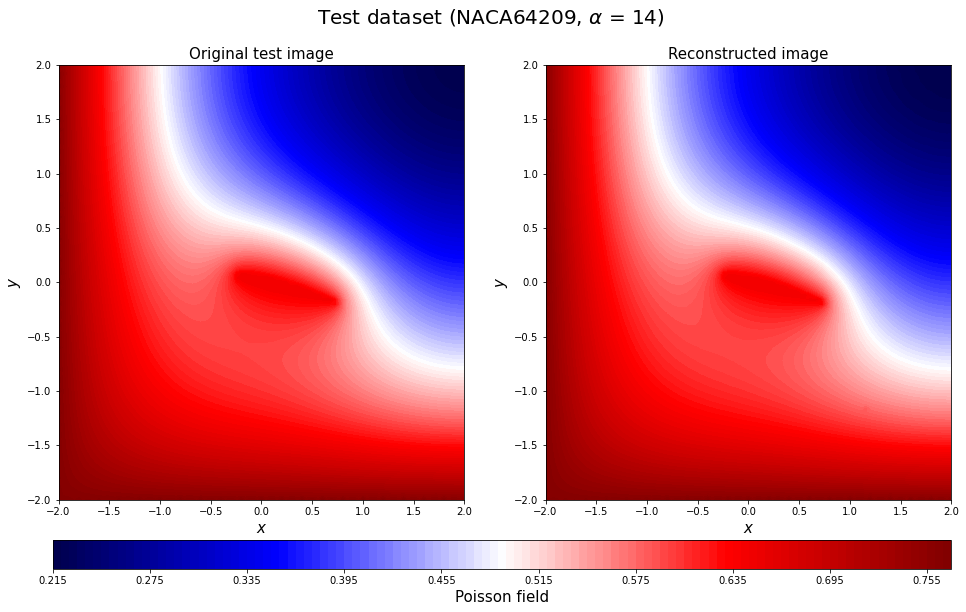

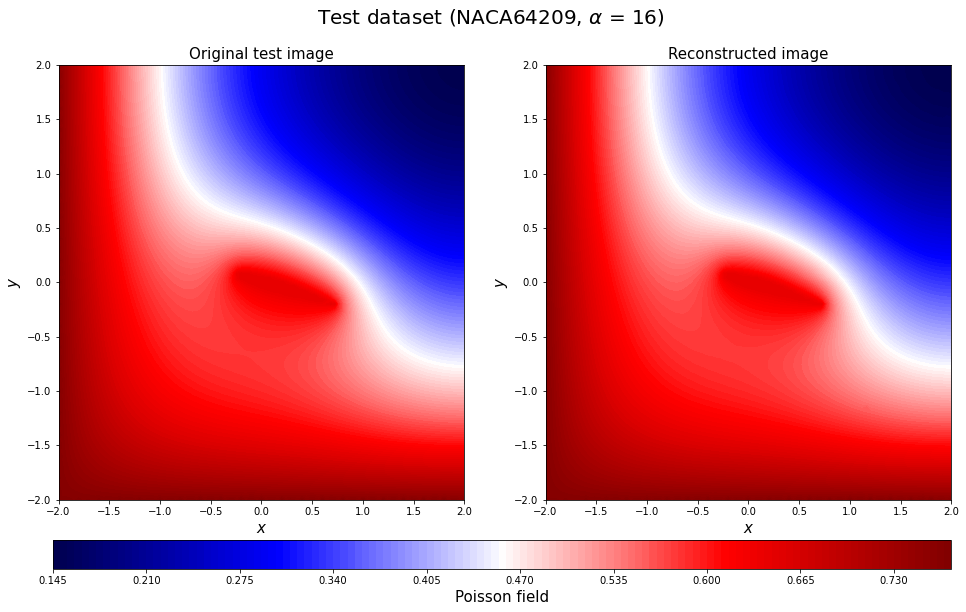

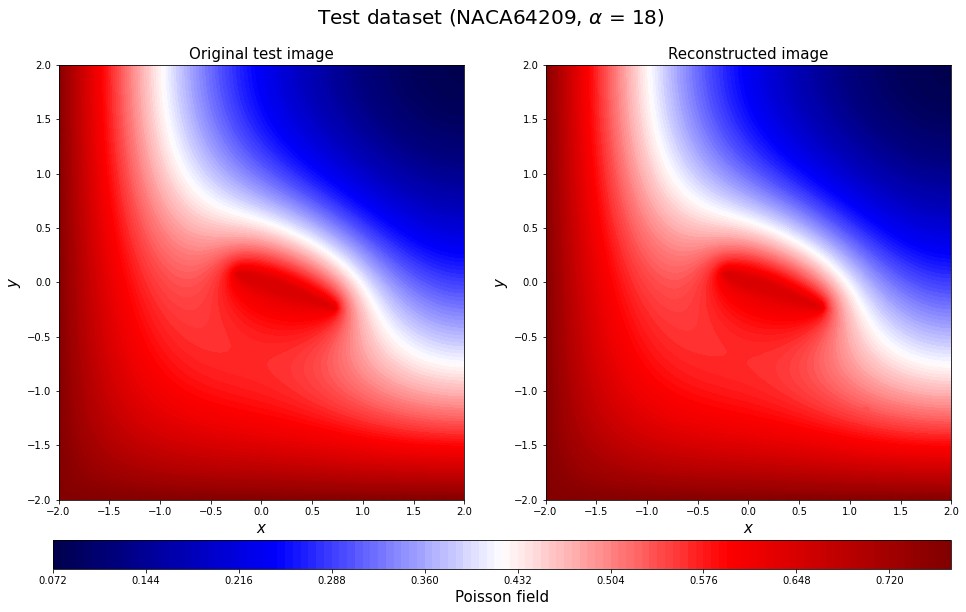

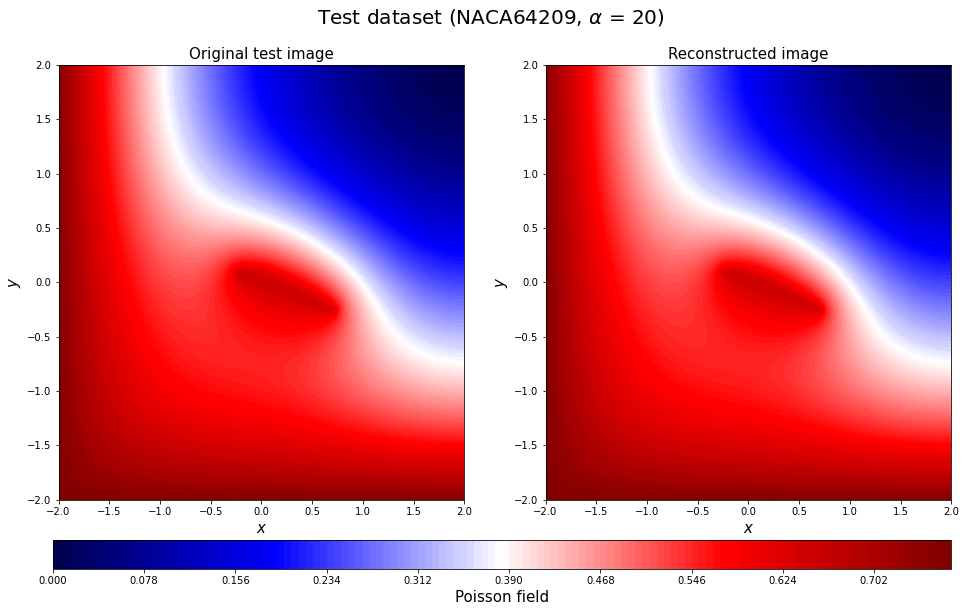

In [60]:
for c in range(0,16):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

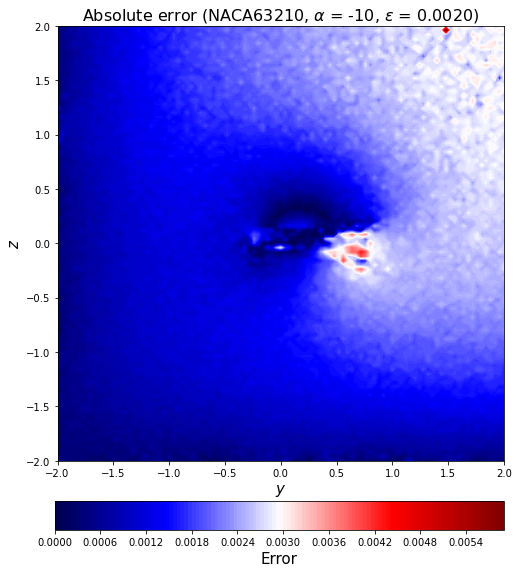

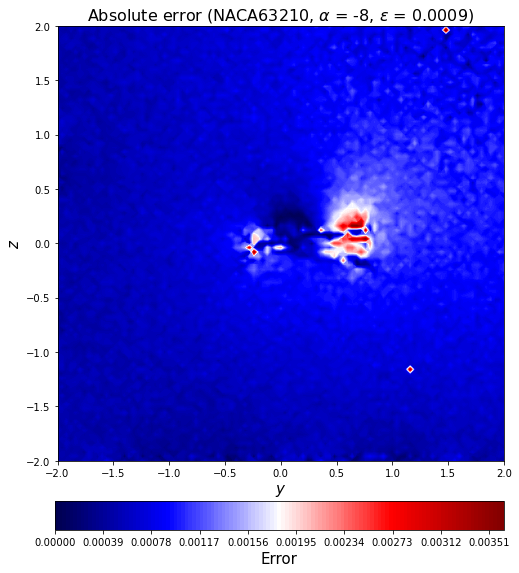

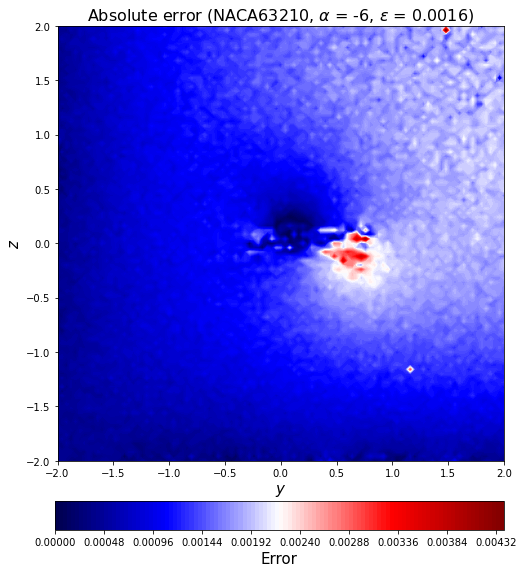

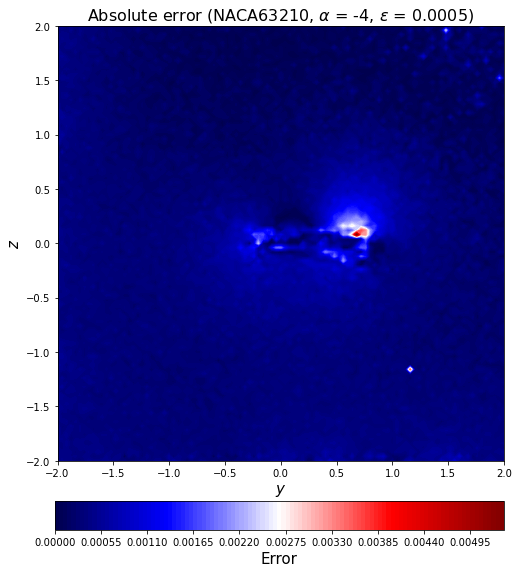

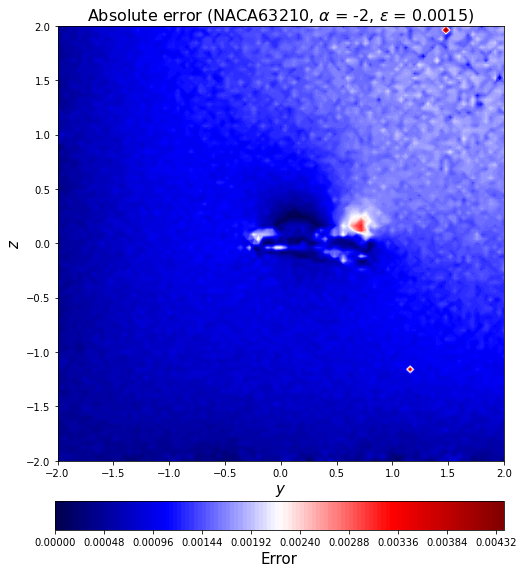

...

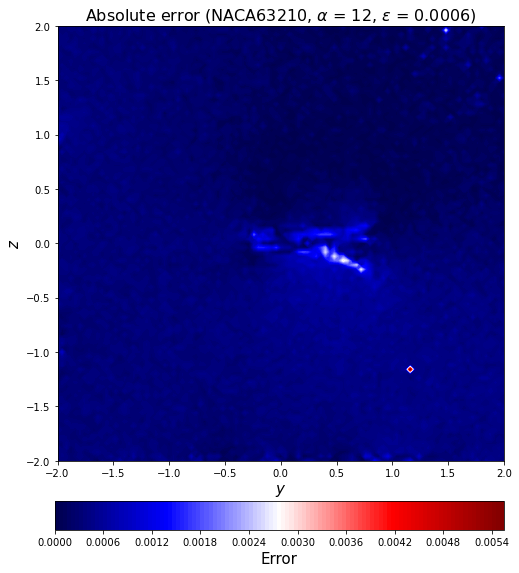

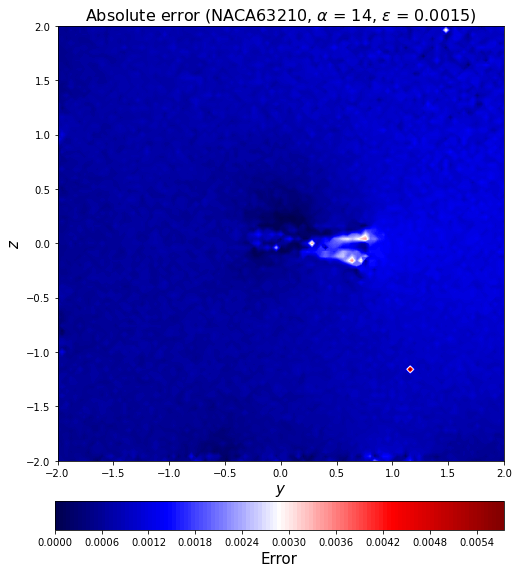

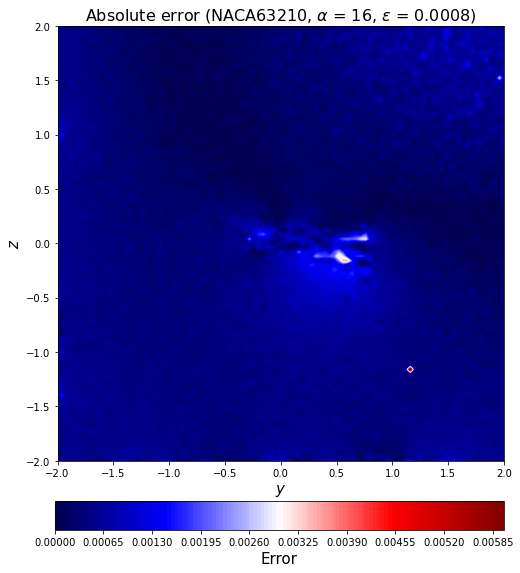

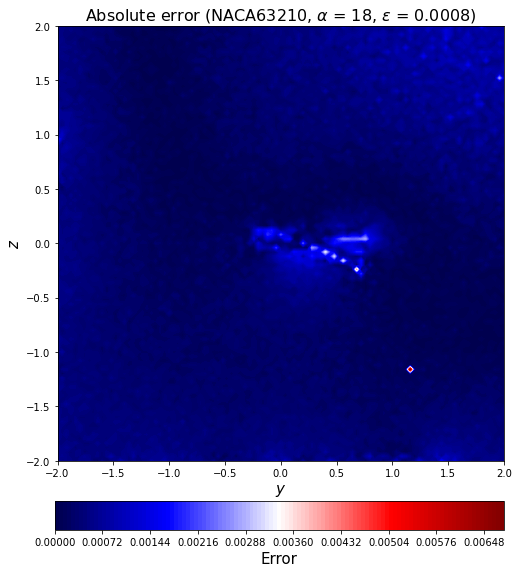

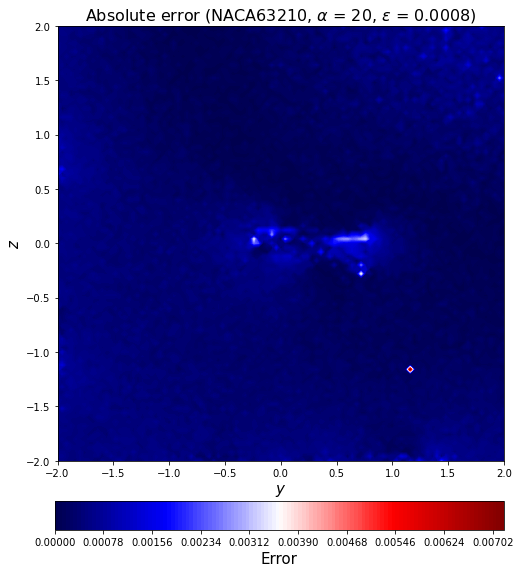

In [61]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[2*16+c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[2*16+c])[3:-2],
                                                                       aa_test[2*16+c], l2_error_test_list[2*16+c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[2*16+c])[3:-2])+str(aa_test[2*16+c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

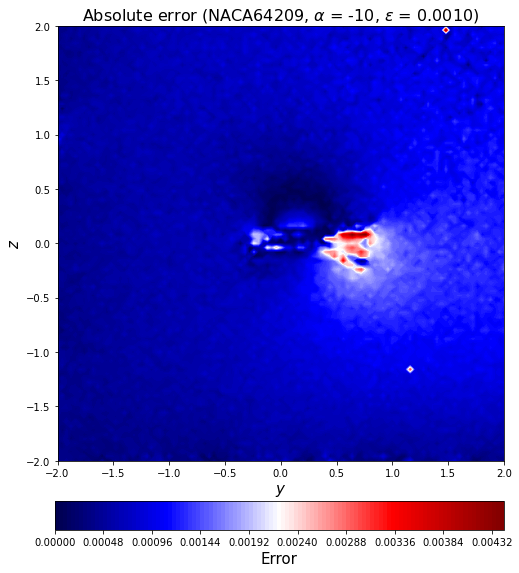

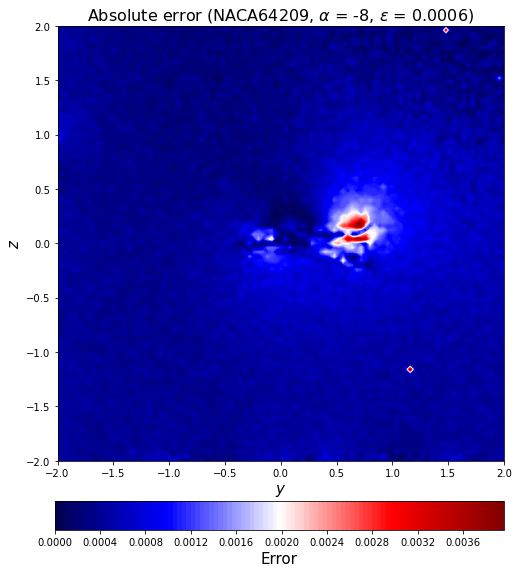

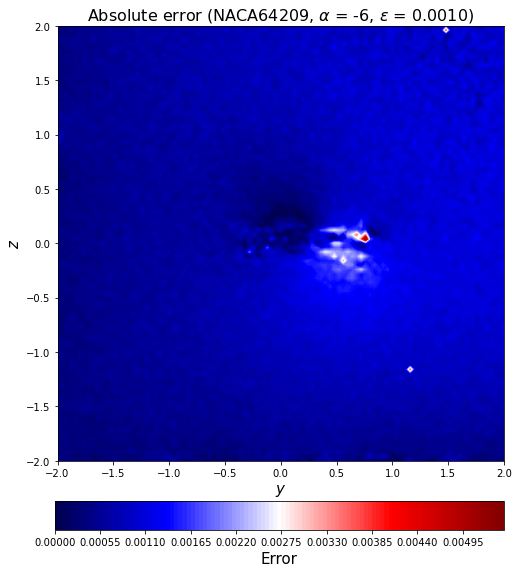

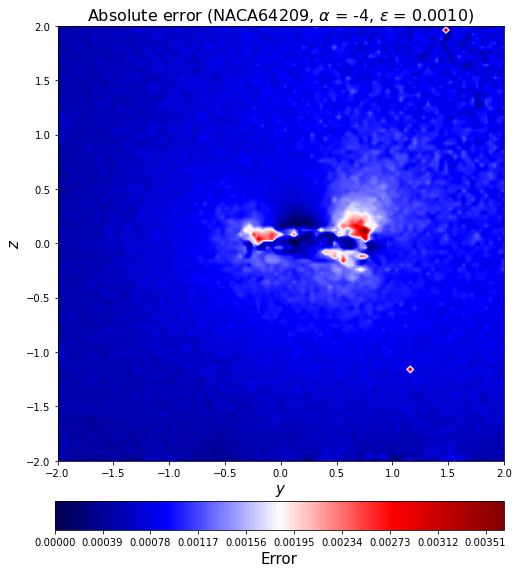

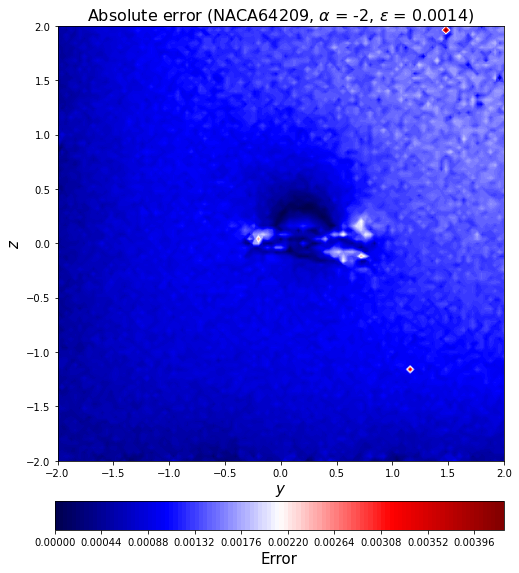

...

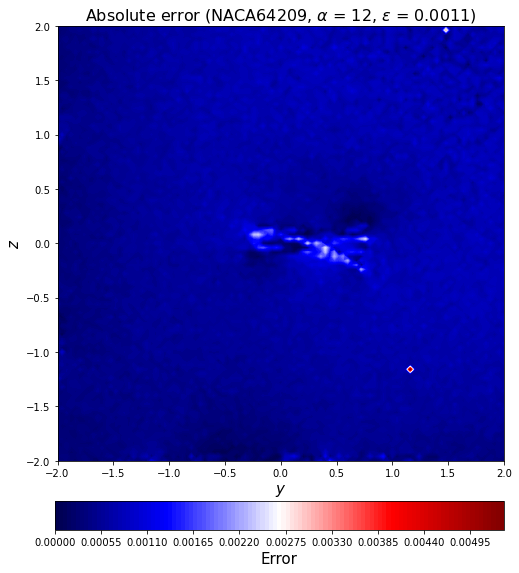

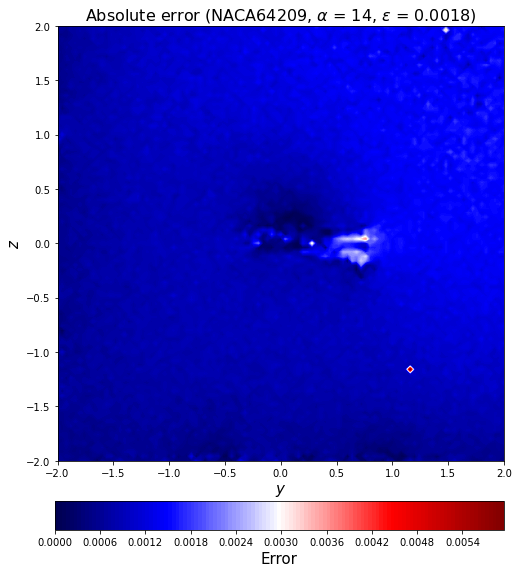

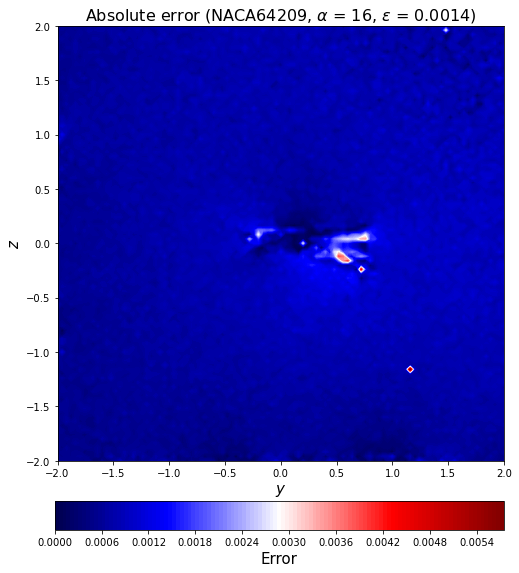

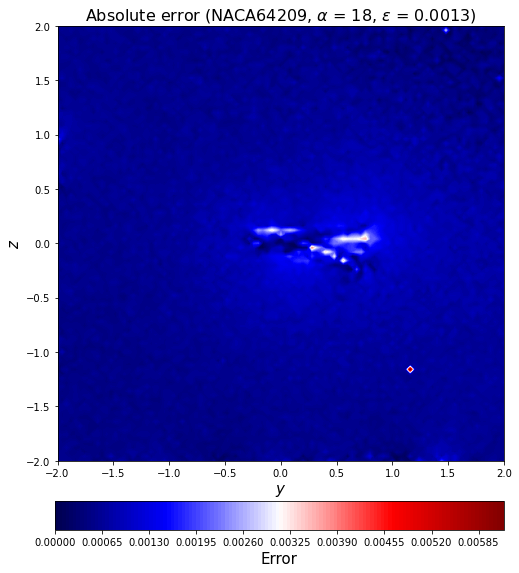

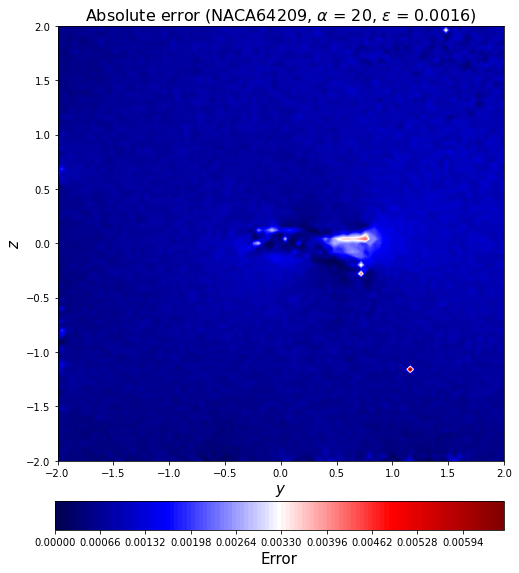

In [62]:
for c in range(0,16):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$y$', fontsize=15)
    ax5.set_ylabel('$z$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

In [93]:
MAPE_train = (np.sum(np.abs(np.sum(y_train)-np.sum(decoded_train))) / np.abs(np.sum(y_train)))/(y_train.shape[0]/16)*100
acc_train = 1-MAPE_train

In [89]:
MAPE_val = (np.sum(np.abs(np.sum(y_val)-np.sum(decoded_val))) / np.abs(np.sum(y_val)))/(y_val.shape[0]/16)*100
acc_val = 1-MAPE_val

In [91]:
MAPE_test = (np.sum(np.abs(np.sum(y_test)-np.sum(decoded_test))) / np.abs(np.sum(y_test)))/(y_test.shape[0]/16)*100
acc_test = 1-MAPE_test

In [94]:
print(MAPE_train)
print(acc_train)

0.0009342733552732613
0.9990657266447267


In [90]:
print(MAPE_val)
print(acc_val)

0.005871799216185258
0.9941282007838147


In [92]:
print(MAPE_test)
print(acc_test)

0.007043295662533218
0.9929567043374667


In [99]:
MAPE_train_list = []
acc_train_list = []
for i in range(0, len(aa_train)):
    MAPE_train_data = (np.sum(np.abs(y_train[i]-decoded_train[i])) / np.sum(np.abs(y_train[i])))/(y_train.shape[0]/16)*100
    MAPE_train_list.append(MAPE_train_data)
    acc_train_data = 1 - MAPE_train_data
    acc_train_list.append(acc_train_data)
print(MAPE_train_list)
print(acc_train_list)

[0.001771908353920108, 0.0015119691835731024, 0.0012261170038126933, 0.0014038838357664056, 0.001097307511270934, 0.0009885107932536838, 0.0013548006699600264, 0.0009267420227218942, 0.0014136714485703944, 0.00076210054435153, 0.0008641027360571259, 0.0008220886403247895, 0.0008701040588327336, 0.0014089779759750294, 0.0016291675101520434, 0.0013017504164557373, 0.0010072585084337767, 0.0010341397261164102, 0.0009990744575096367, 0.0007906906685470964, 0.000820950609244823, 0.0008457706808625733, 0.0010505816486249082, 0.0011617949576153636, 0.0010814474757557205, 0.0008916765598963363, 0.0007617429748950847, 0.000921729764931062, 0.0005135688422077494, 0.000859272282782976, 0.0009173022686948042, 0.0011358541587229017, 0.0010707042203451362, 0.0012889875568293963, 0.0013240764917889119, 0.0008699278679243814, 0.0012405167992807706, 0.00040922859400336085, 0.001283312536235492, 0.0006740409075815722, 0.000966333508293583, 0.000624254637309138, 0.0007835219083795316, 0.00090535403918296

In [97]:
MAPE_val_list = []
acc_val_list = []
for i in range(0, len(aa_val)):
    MAPE_val_data = (np.sum(np.abs(y_val[i]-decoded_val[i])) / np.sum(np.abs(y_val[i])))/(y_val.shape[0]/16)*100
    MAPE_val_list.append(MAPE_val_data)
    acc_val_data = 1 - MAPE_val_data
    acc_val_list.append(acc_val_data)
print(MAPE_val_list)
print(acc_val_list)

[0.01189197494975814, 0.011331007327628026, 0.017550136254907867, 0.019538673655872422, 0.007263395077197384, 0.012484358302797654, 0.0054022127322346705, 0.003911762324957624, 0.0046271354798083355, 0.006083412210229118, 0.011873115338112708, 0.006608813754829809, 0.0048630456875513855, 0.00411442030523611, 0.007445513944030232, 0.015546582507994738, 0.010734800724368934, 0.0037810328942095377, 0.0033446379698965235, 0.006611487312009947, 0.013222502515060752, 0.006018098961731141, 0.005751793056110823, 0.019086332134425277, 0.019117640901955352, 0.01600460953060698, 0.015569125157672385, 0.01714038055729512, 0.01764901919704749, 0.023216943386882283, 0.013848122111992543, 0.013125046376368635, 0.02985293297247297, 0.011696178295294537, 0.03127625676086724, 0.04020993492865445, 0.01565014972336408, 0.008905971362238082, 0.042281568958231784, 0.008977403897828992, 0.04923429541563683, 0.022877972889399953, 0.009246019725538684, 0.03134169544735654, 0.018089987200288885, 0.0406349695138

In [98]:
MAPE_test_list = []
acc_test_list = []
for i in range(0, len(aa_test)):
    MAPE_test_data = (np.sum(np.abs(y_test[i]-decoded_test[i])) / np.sum(np.abs(y_test[i])))/(y_test.shape[0]/16)*100
    MAPE_test_list.append(MAPE_test_data)
    acc_test_data = 1 - MAPE_test_data
    acc_test_list.append(acc_test_data)
print(MAPE_test_list)
print(acc_test_list)

[0.006250168640334881, 0.003976585250318708, 0.006624889552563575, 0.007015938207187782, 0.009175509726538517, 0.00533270204925163, 0.0033048257522206746, 0.009550772270555832, 0.006880005036597139, 0.011513761884597833, 0.009095519463614395, 0.007559611751504023, 0.012608543210022147, 0.010097386355224554, 0.009573009796347265, 0.011820364965463391, 0.013802653921835236, 0.012349972848260506, 0.015165849057661218, 0.020944415276940753, 0.016724755746228327, 0.013014192788820806, 0.023793627717199298, 0.0152586995561604, 0.0305952024572818, 0.013426908281517635, 0.0031350944591984724, 0.020473740576487175, 0.010420742441256804, 0.03613305530150651, 0.00864866930729828, 0.017743538703137322, 0.012895824004717215, 0.006111169256494321, 0.010323606735775976, 0.0030155464004276403, 0.009670382122938675, 0.00592836359495948, 0.0050992688571434635, 0.0033882604237612914, 0.009682297955244905, 0.004553971460762014, 0.004086657918042722, 0.0037576950377215456, 0.010353494007178093, 0.005356112

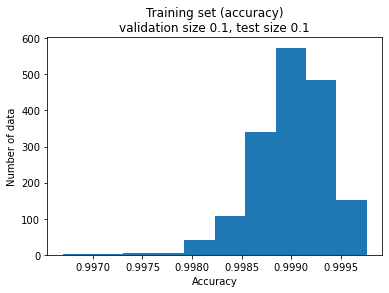

In [101]:
plt.hist(acc_train_list)
plt.title('Training set (accuracy)\nvalidation size 0.1, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
#plt.grid()
plt.show()

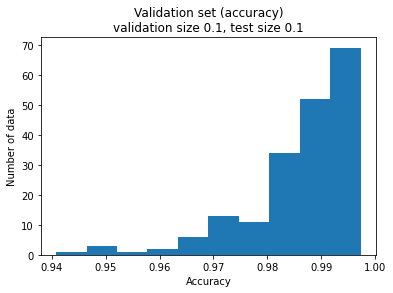

In [100]:
plt.hist(acc_val_list)
plt.title('Validation set (accuracy)\nvalidation size 0.1, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

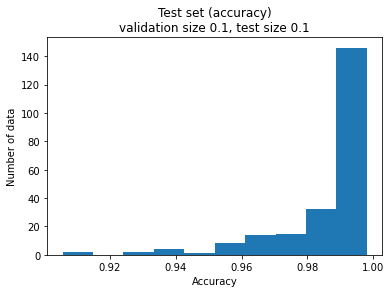

In [96]:
plt.hist(acc_test_list)
plt.title('Test set (accuracy)\nvalidation size 0.1, test size 0.1')
plt.ylabel('Number of data')
plt.xlabel('Accuracy')
plt.show()

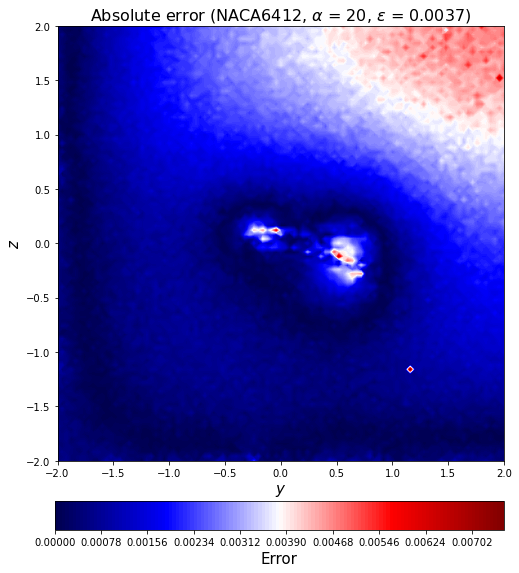

In [71]:
error_test_abs2_rotate = error_test_abs[-1].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-1])[3:-2],
                                                                   aa_test[-1], l2_error_test_list[-1]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-1])[3:-2])+str(aa_test[-1])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

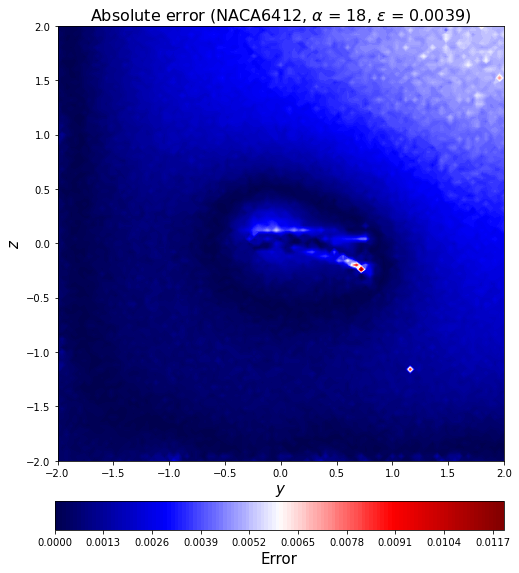

In [72]:
error_test_abs2_rotate = error_test_abs[-2].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-2])[3:-2],
                                                                   aa_test[-2], l2_error_test_list[-2]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-2])[3:-2])+str(aa_test[-2])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

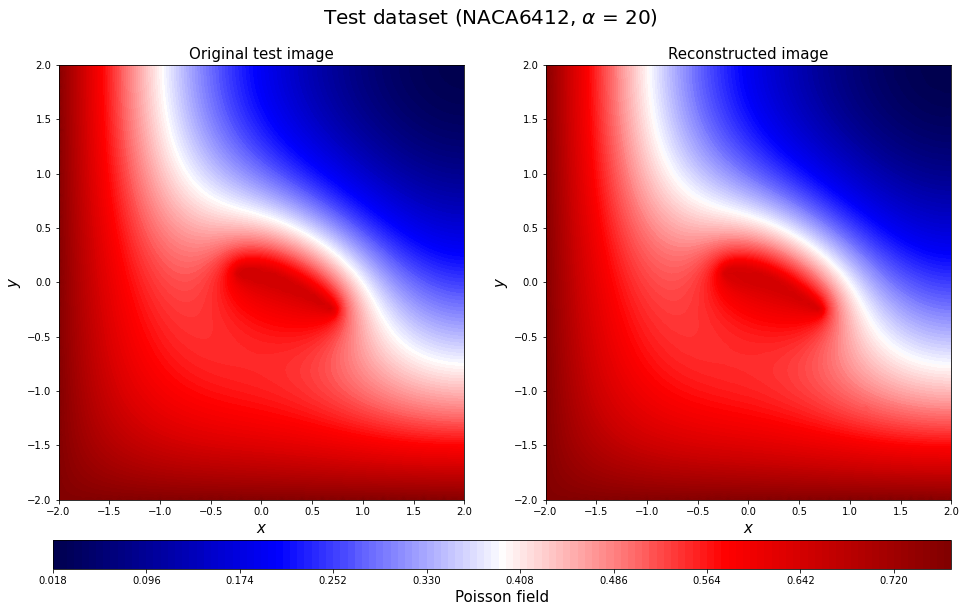

In [73]:
c=-1
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

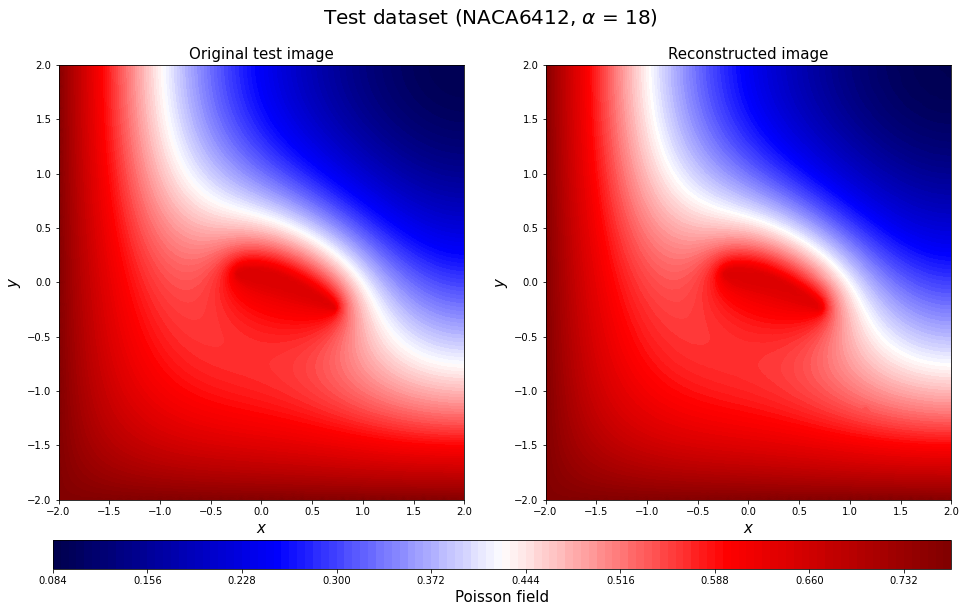

In [74]:
c=-2
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

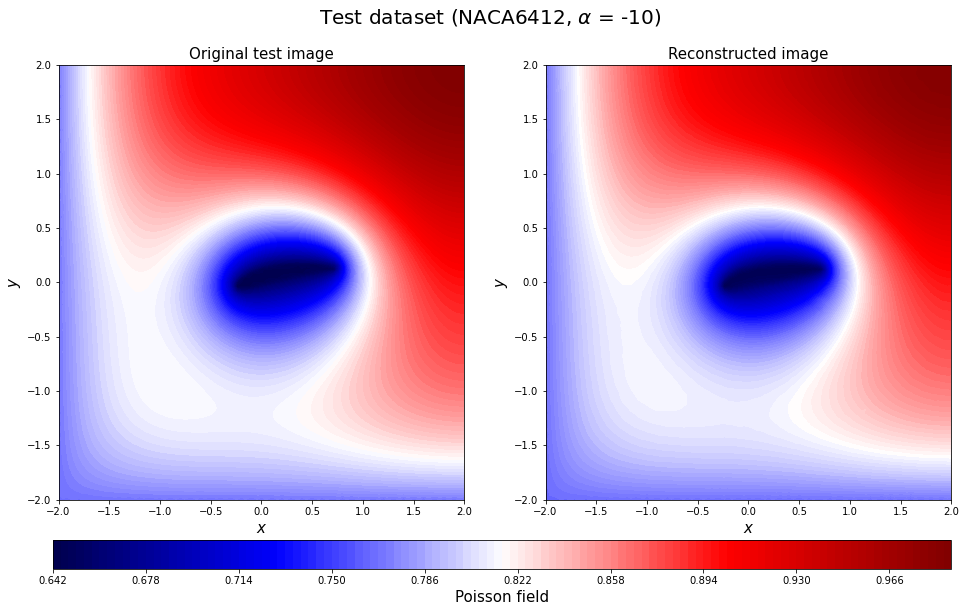

In [75]:
c=-16
plt.figure(figsize=(16, 8))
y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

xrange = np.linspace(-2, 2, n_grid)
yrange = np.linspace(-2, 2, n_grid)
xmesh, ymesh = np.meshgrid(xrange, yrange)

ax = plt.subplot(1, 2, 1)
a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Original test image', fontsize=15)

# Display reconstruction
ax = plt.subplot(1, 2, 2)
a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
ax.set_xlabel('$x$', fontsize=15)
ax.set_ylabel('$y$', fontsize=15)
ax.set_title('Reconstructed image', fontsize=15)
cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
cbar.set_label('Poisson field', fontsize=15)
#cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

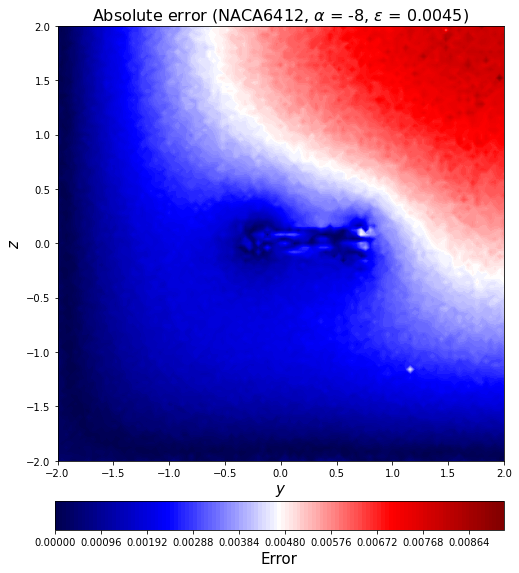

In [76]:
error_test_abs2_rotate = error_test_abs[-15].reshape(n_grid,n_grid).T

fig5 = plt.figure(figsize = (8, 8))
ax5 = fig5.add_subplot(111)
mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[-15])[3:-2],
                                                                   aa_test[-15], l2_error_test_list[-15]), fontsize=16)
ax5.set_xlabel('$y$', fontsize=15)
ax5.set_ylabel('$z$', fontsize=15)

cax = plt.axes([0.12, 0.005, 0.78, 0.05])
cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
cbar.set_label('Error', fontsize=15)

save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[-15])[3:-2])+str(aa_test[-15])+".jpg"
plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
plt.show()

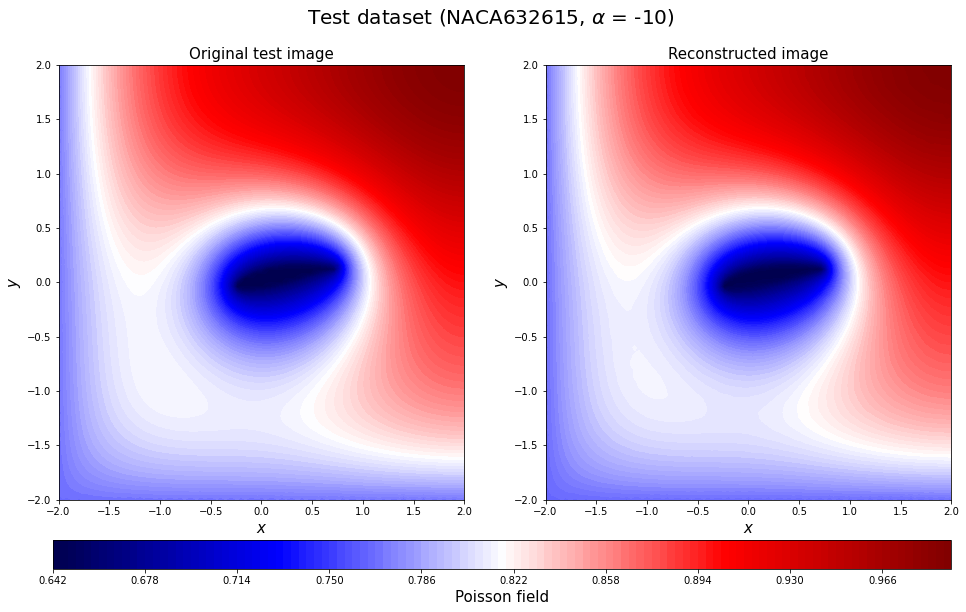

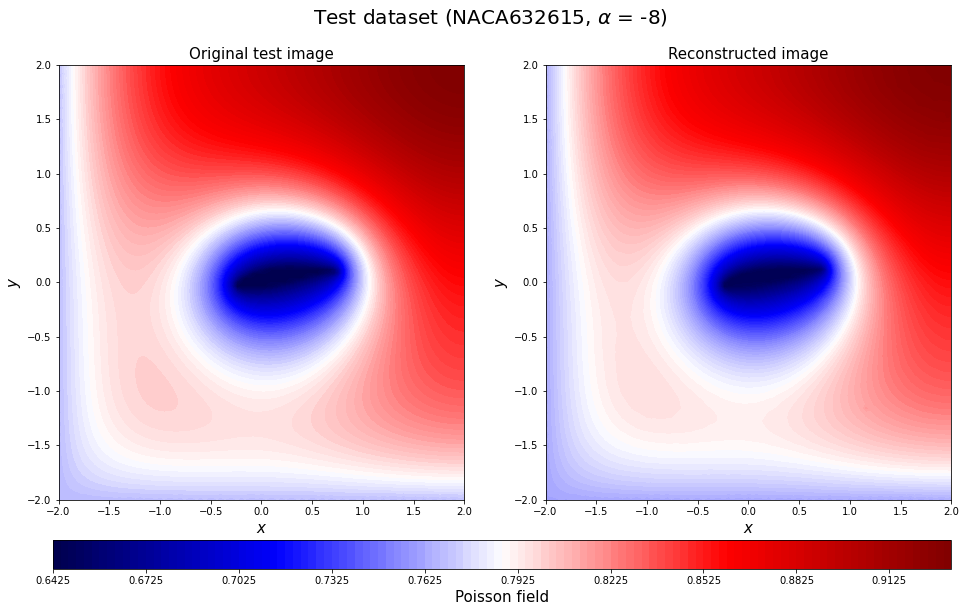

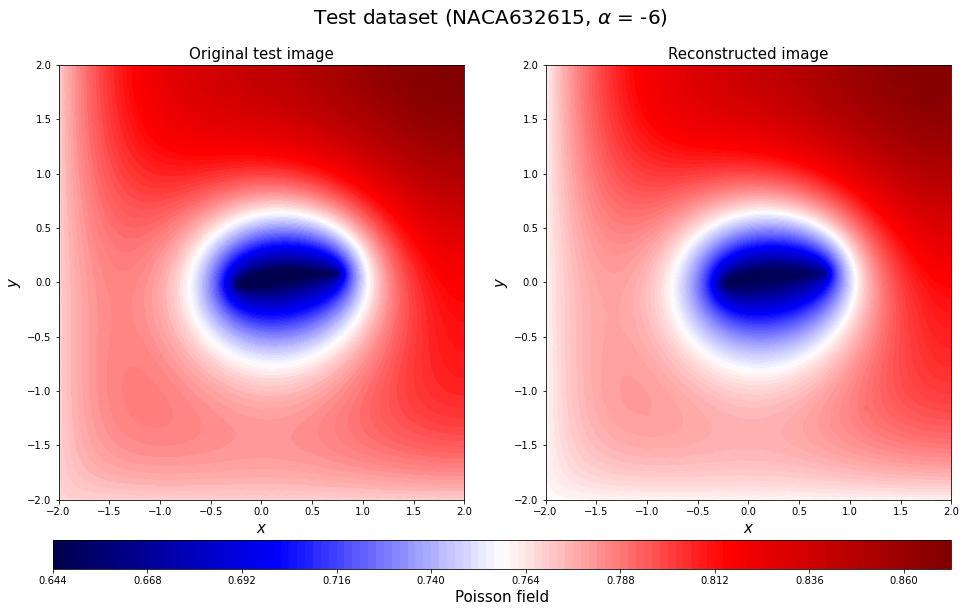

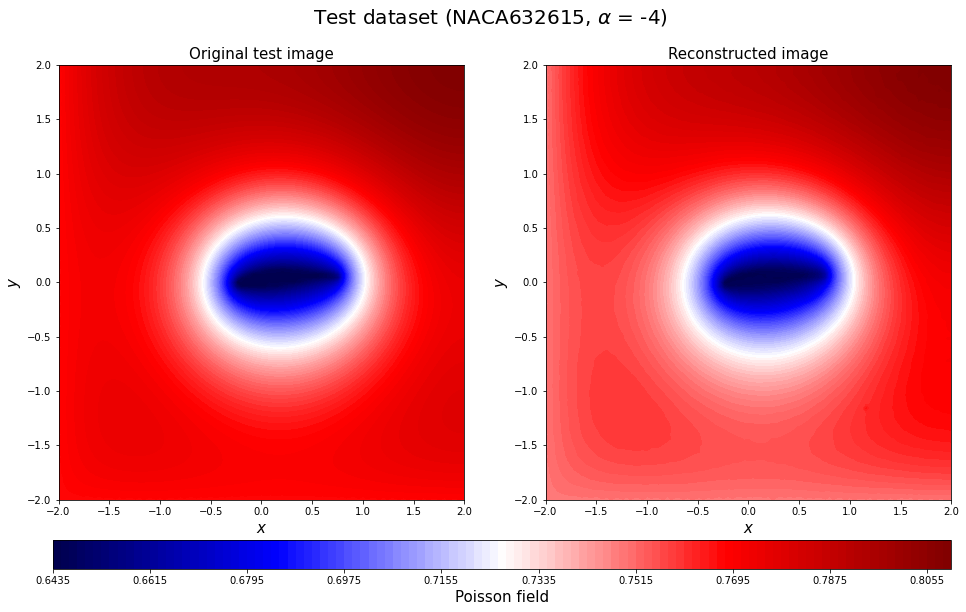

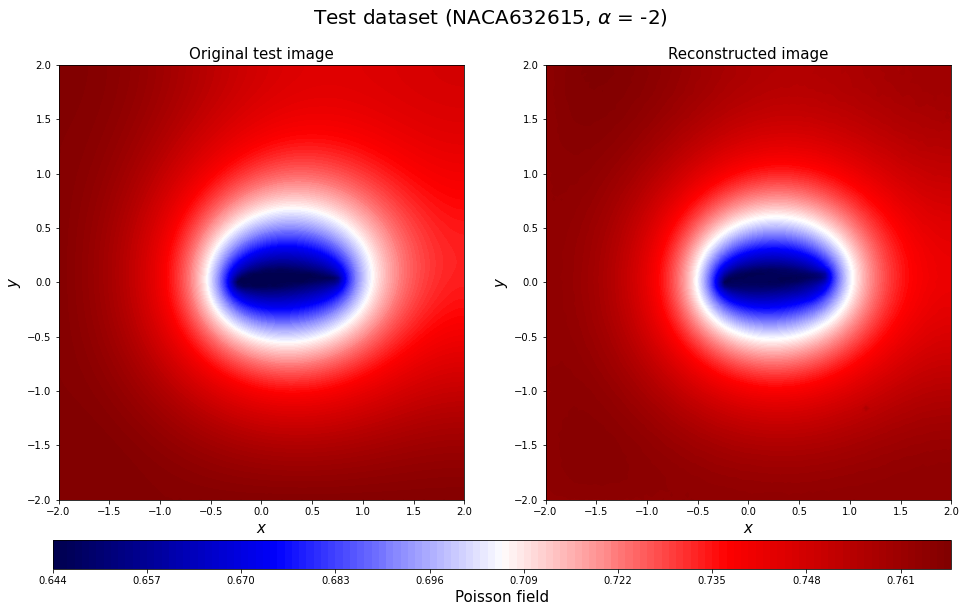

...

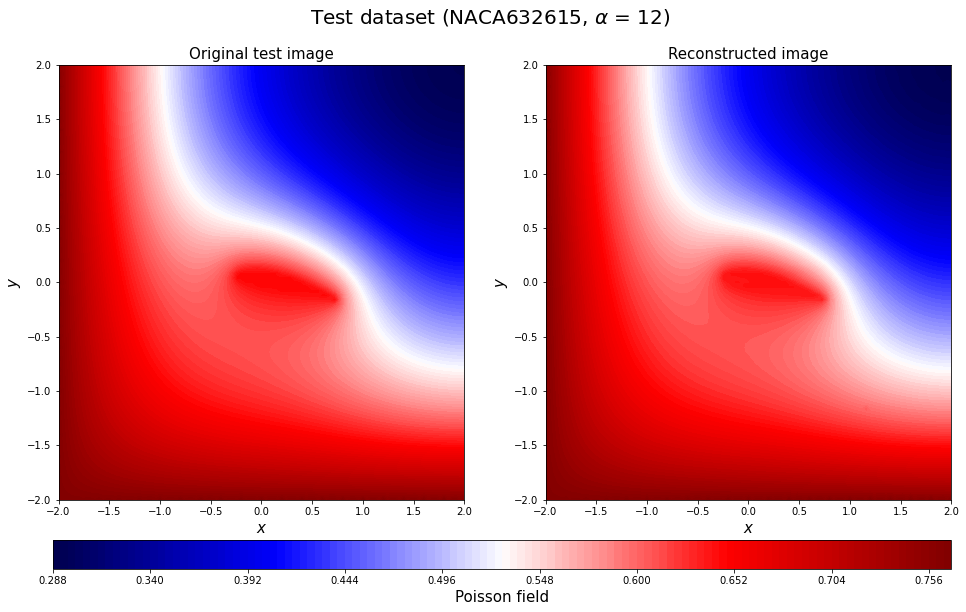

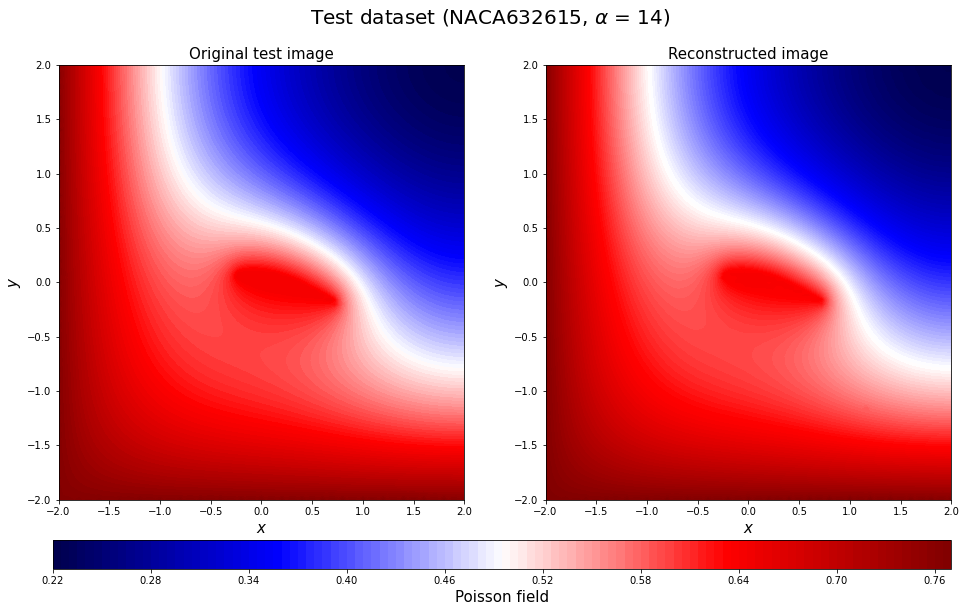

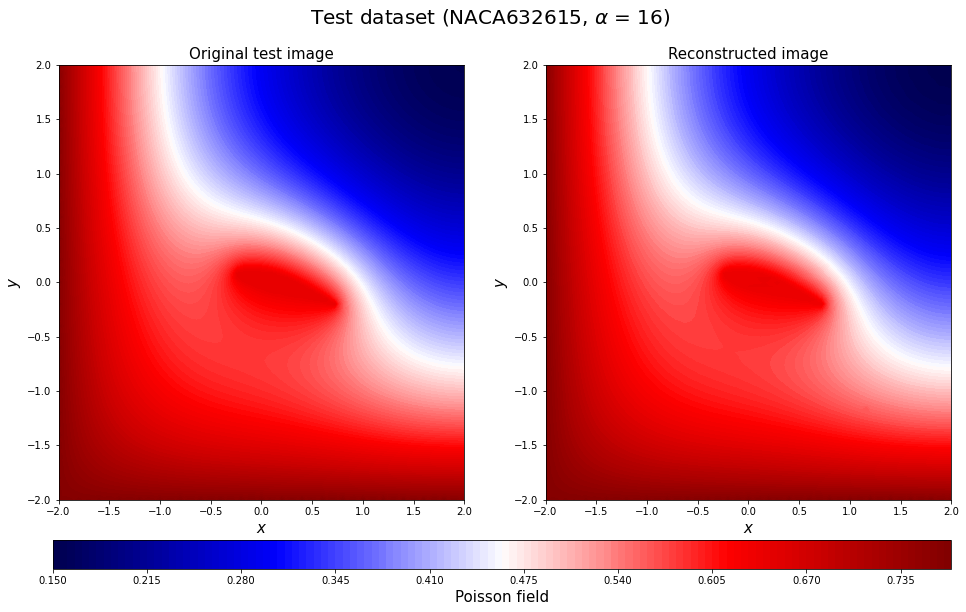

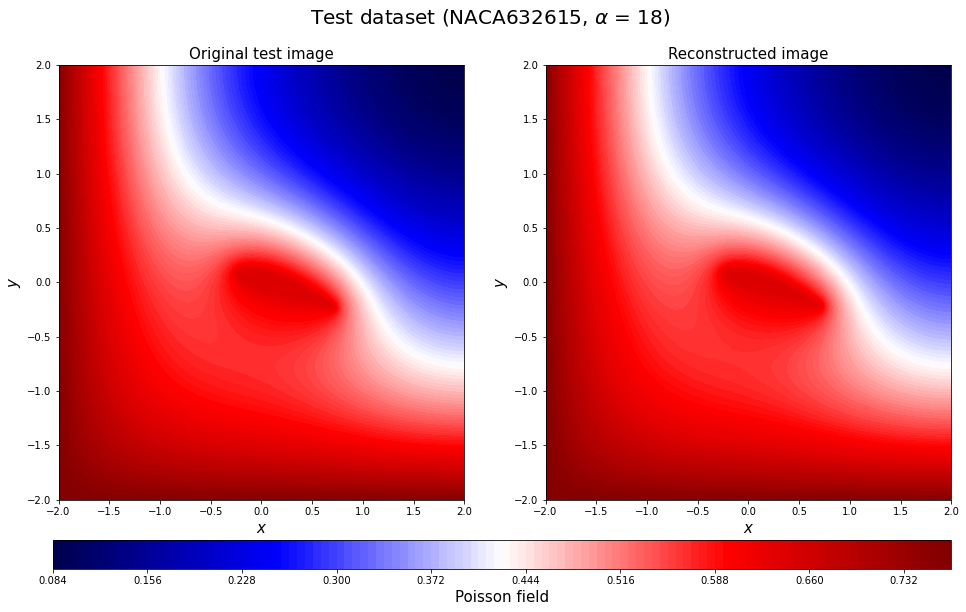

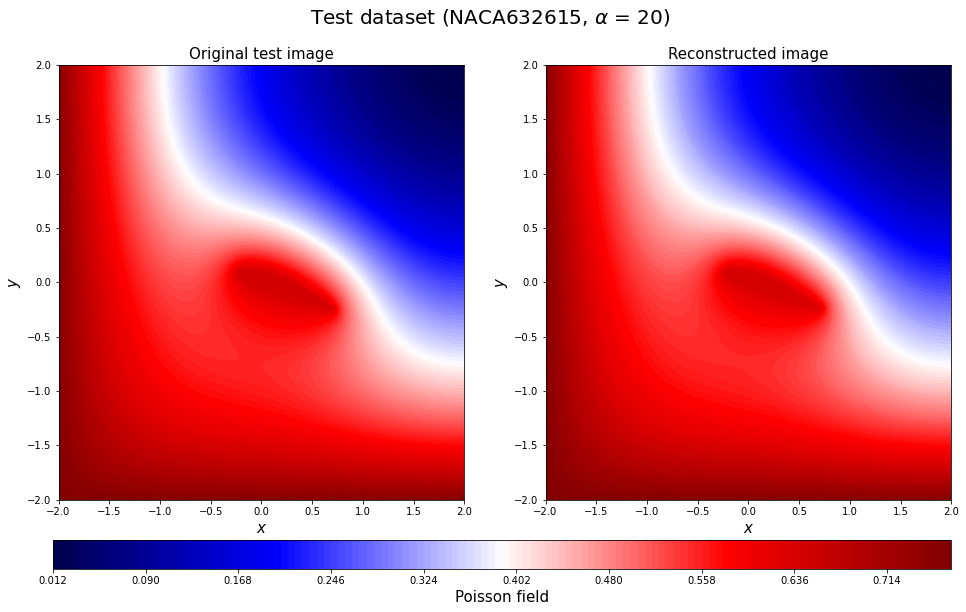

In [77]:
for c in range(96,112):
    plt.figure(figsize=(16, 8))
    y_test0_rotate = y_test[c].reshape(n_grid,n_grid).T
    decoded_rotate = decoded_test[c].reshape(n_grid,n_grid).T

    xrange = np.linspace(-2, 2, n_grid)
    yrange = np.linspace(-2, 2, n_grid)
    xmesh, ymesh = np.meshgrid(xrange, yrange)

    ax = plt.subplot(1, 2, 1)
    a1 = plt.contourf(xmesh, ymesh, y_test0_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Original test image', fontsize=15)

    # Display reconstruction
    ax = plt.subplot(1, 2, 2)
    a2 = plt.contourf(xmesh, ymesh, decoded_rotate, levels=128, cmap='seismic')
    ax.set_xlabel('$x$', fontsize=15)
    ax.set_ylabel('$y$', fontsize=15)
    ax.set_title('Reconstructed image', fontsize=15)
    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(a1, cax=cax, orientation="horizontal")
    cbar.set_label('Poisson field', fontsize=15)
    #cbar.set_ticks([-0.5, -0.4, -0.3, -0.2, -0.1, 0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9])

    plt.suptitle(r'Test dataset (%s, $\alpha$ = %d)' %(np.array2string(geo_test[c])[3:-2], aa_test[c]),fontsize=20)
    save_fig_name = "20221027Prediction_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()

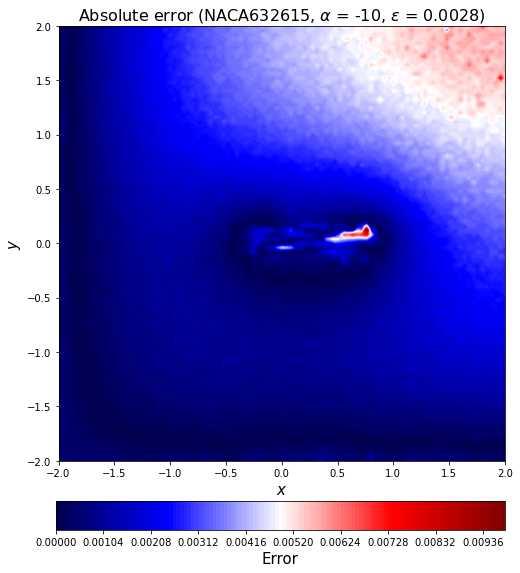

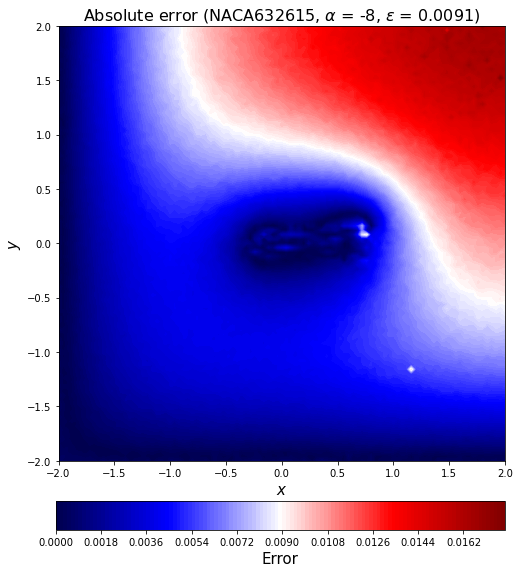

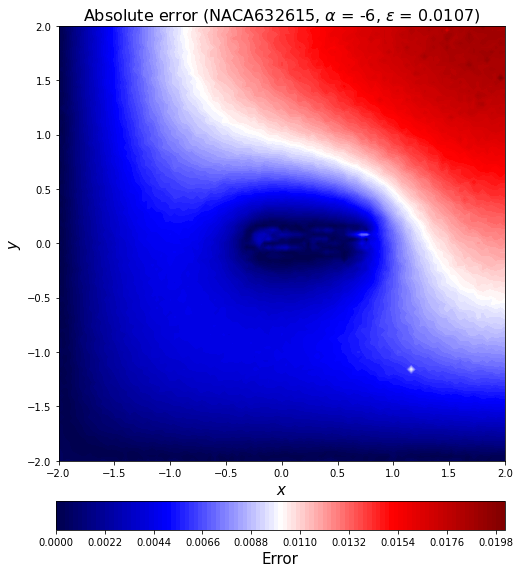

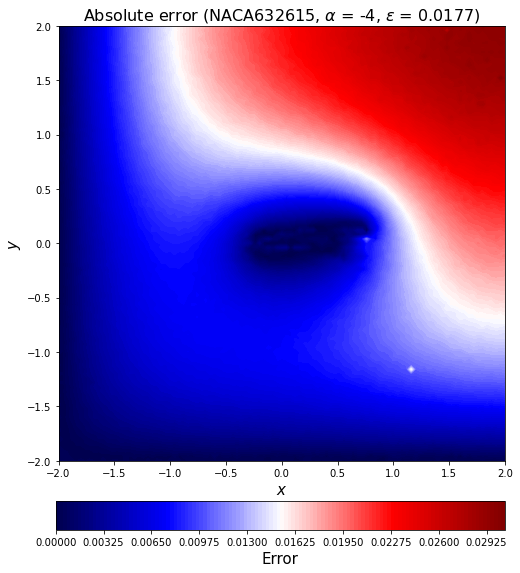

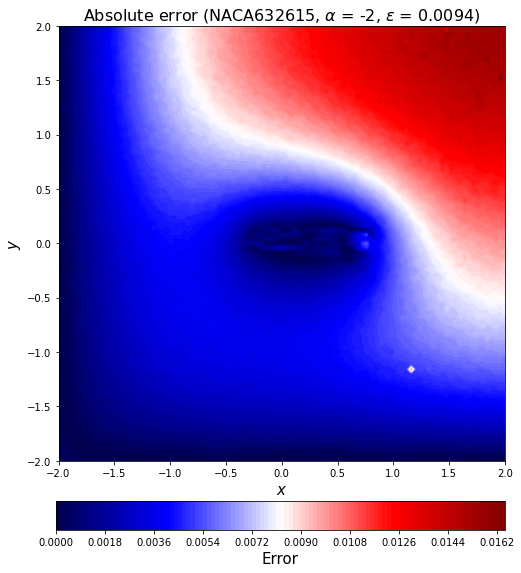

...

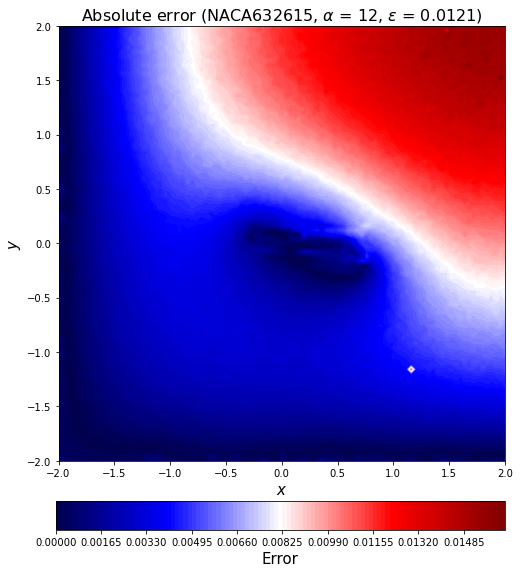

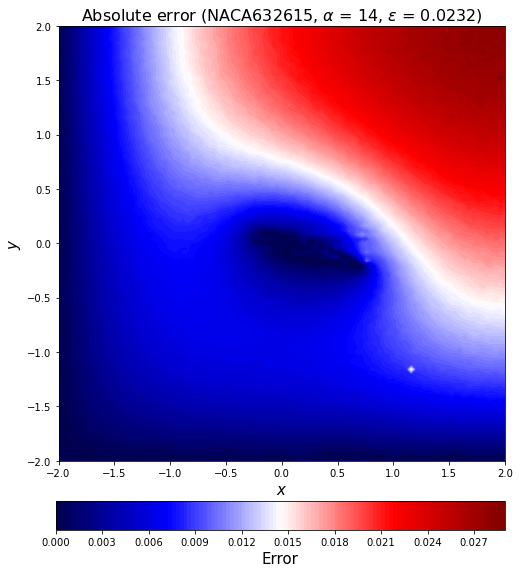

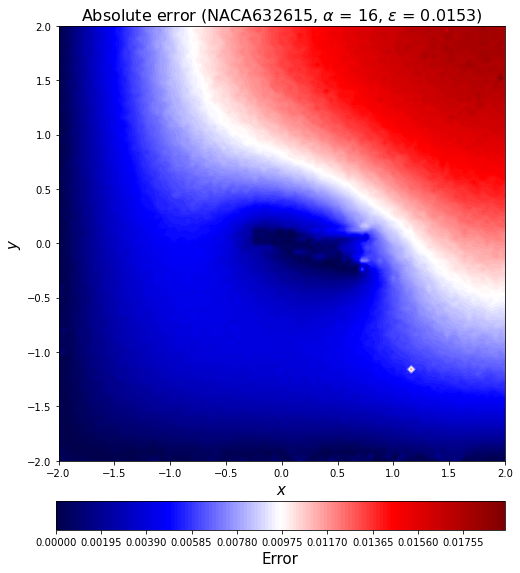

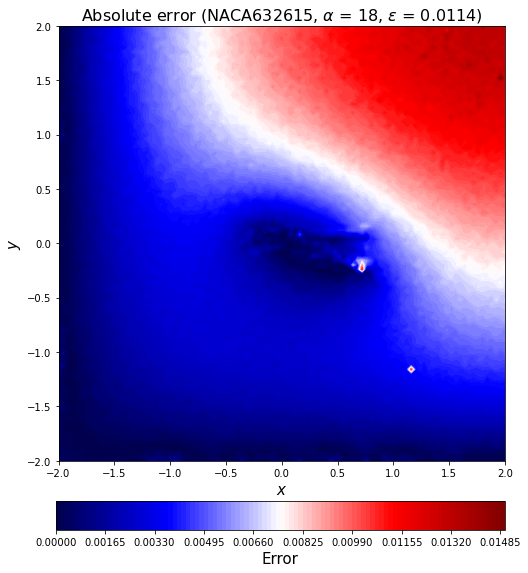

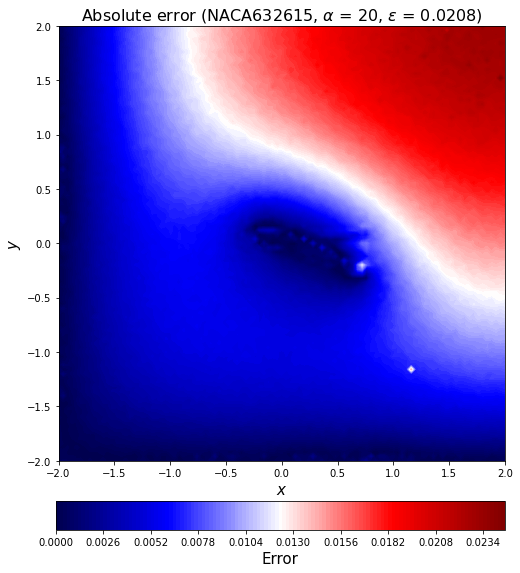

In [78]:
for c in range(96,112):
    error_test_abs2_rotate = error_test_abs[c].reshape(n_grid,n_grid).T

    fig5 = plt.figure(figsize = (8, 8))
    ax5 = fig5.add_subplot(111)
    mappable = ax5.contourf(xmesh, ymesh, error_test_abs2_rotate, levels=128, cmap='seismic')
    ax5.set_title(r'Absolute error (%s, $\alpha$ = %d, $\epsilon$ = %.4f)' %(np.array2string(geo_test[c])[3:-2],
                                                                       aa_test[c], l2_error_test_list[c]), fontsize=16)
    ax5.set_xlabel('$x$', fontsize=15)
    ax5.set_ylabel('$y$', fontsize=15)

    cax = plt.axes([0.12, 0.005, 0.78, 0.05])
    cbar = plt.colorbar(mappable, cax=cax, orientation="horizontal")
    cbar.set_label('Error', fontsize=15)

    save_fig_name = "20221027PredictionError_Poisson_bc2(test)"+str(np.array2string(geo_test[c])[3:-2])+str(aa_test[c])+".jpg"
    plt.savefig(save_fig_name, dpi=300, bbox_inches='tight', pad_inches=0.3)
    plt.show()